# Training Notebook for Transformer
To be run using on the Google Colab servers

### Global setup

In [ ]:
import os
import torch
import torch.nn as nn
import torchvision
import numpy as np
import matplotlib.pyplot as plt

# mount google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Connect to Github repository and import code

In [ ]:
# RUN THIS ONCE AT THE START OF THE SESSION
# clone github repository
!git clone https://github.com/Aivon99/VQ-VAE-Tranformer-Image-Gen.git
 #TODO modify http

# add repo to sys path to allow imports
import sys
sys.path.append('/content/VQ-VAE-Tranformer-Image-Gen')

fatal: destination path 'VQ-VAE-Tranformer-Image-Gen' already exists and is not an empty directory.


In [ ]:
# RUN THIS AT THE START AS WELL AS EVERY TIME THE REPO IS UPDATED
# pull changes from github
%cd /content/VQ-VAE-Tranformer-Image-Gen
!git pull https://github.com/Aivon99/VQ-VAE-Tranformer-Image-Gen.git

# refrsh the imports
from importlib import reload
import TF.model
reload(TF.model)
import VQ.model
reload(VQ.model)

from VQ.model import Encoder, Decoder, Quantizer, VQ_VAE, LATENT_W, LATENT_H, NUM_EMBEDDINGS
from TF.model import TransformerPrior, VOCAB_SIZE, SEQ_LEN, BOS_ID

assert VOCAB_SIZE == NUM_EMBEDDINGS + 1
assert SEQ_LEN == LATENT_H * LATENT_W

/content/VQ-VAE-Tranformer-Image-Gen
From https://github.com/Aivon99/VQ-VAE-Tranformer-Image-Gen
 * branch            HEAD       -> FETCH_HEAD
Already up to date.


### Load pretrained Decoder and CelebA embeddings

Loading dataset...
Loading VQ-VAE model...


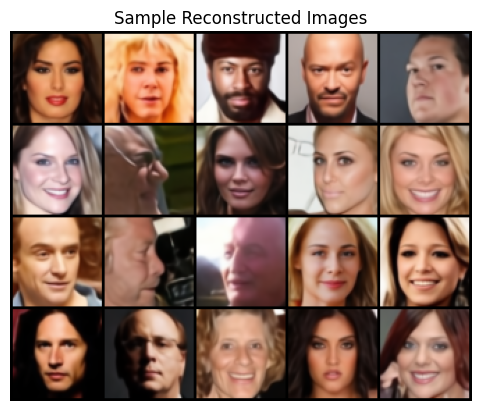

In [ ]:
MODEL_DIR = '/content/drive/MyDrive/vq_models_large'

# load CelebA embeddings dataset
print('Loading dataset...')
dataset_path = os.path.join(MODEL_DIR, 'celeba_vq_indices_uint16n.pt')
celeba_embeddings = torch.utils.data.TensorDataset(torch.load(dataset_path))

# load VQ-VAE model parameters
print('Loading VQ-VAE model...')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
encoder = Encoder()
decoder = Decoder()
quantizer = Quantizer(use_EMA=True)
vq_vae = VQ_VAE(encoder, decoder, quantizer, use_EMA=True).to(device)
vq_vae.eval()

checkpoint_path = os.path.join(MODEL_DIR, 'checkpoint.pt')
checkpoint = torch.load(checkpoint_path, map_location=device)
vq_vae.load_state_dict(checkpoint['model_state'])

# visualize
grid_x = 5
grid_y = 4

samples = torch.stack([celeba_embeddings[i][0] for i in range(grid_x * grid_y)]).long().to(device)
images = vq_vae.reconstruct_from_indices(samples.view(-1, LATENT_W, LATENT_H))
img = torchvision.utils.make_grid(images, grid_x, normalize=True, value_range=(0, 1))

plt.title(f'Sample Reconstructed Images')
plt.axis('off')
plt.imshow(img.permute(1,2,0).cpu())

### Train model

In [ ]:
raw = torch.load(dataset_path)
print(raw.shape)          # should be [405198, 256]
raw_i = raw.to(torch.int32)
print(raw_i.min(), raw_i.max())
print(raw_i.dtype)


torch.Size([405198, 256])
tensor(0, dtype=torch.int32) tensor(511, dtype=torch.int32)
torch.int32


18:02:39 Begin Training
18:02:57 TRAINING Step [100/87065]; Loss: 6.060921
18:03:15 TRAINING Step [200/87065]; Loss: 5.724394
18:03:33 TRAINING Step [300/87065]; Loss: 5.517227
18:03:50 TRAINING Step [400/87065]; Loss: 5.411881
18:04:08 TRAINING Step [500/87065]; Loss: 5.344769
18:04:26 TRAINING Step [600/87065]; Loss: 5.299956
18:04:43 TRAINING Step [700/87065]; Loss: 5.263011
18:05:01 TRAINING Step [800/87065]; Loss: 5.229303
18:05:19 TRAINING Step [900/87065]; Loss: 5.202762
18:05:37 TRAINING Step [1000/87065]; Loss: 5.179669
Checkpoint saved at step 1000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


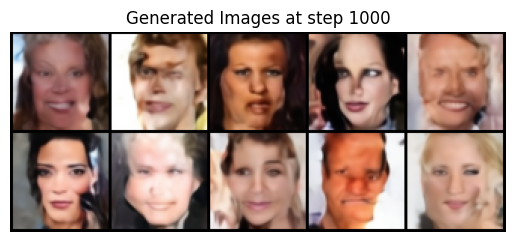

18:05:56 TRAINING Step [1100/87065]; Loss: 5.162029
18:06:14 TRAINING Step [1200/87065]; Loss: 5.139288
18:06:31 TRAINING Step [1300/87065]; Loss: 5.127717
18:06:49 TRAINING Step [1400/87065]; Loss: 5.105353
18:07:07 TRAINING Step [1500/87065]; Loss: 5.088443
18:07:25 TRAINING Step [1600/87065]; Loss: 5.077117
18:07:42 TRAINING Step [1700/87065]; Loss: 5.065236
18:08:00 TRAINING Step [1800/87065]; Loss: 5.051993
18:08:18 TRAINING Step [1900/87065]; Loss: 5.039054
18:08:35 TRAINING Step [2000/87065]; Loss: 5.032611
Checkpoint saved at step 2000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


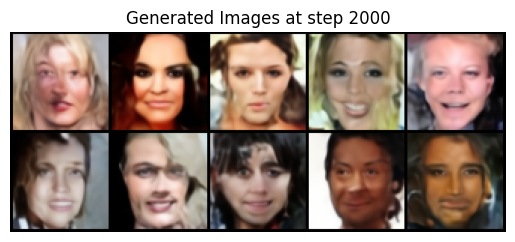

18:08:55 TRAINING Step [2100/87065]; Loss: 5.018157
18:09:12 TRAINING Step [2200/87065]; Loss: 5.006185
18:09:30 TRAINING Step [2300/87065]; Loss: 4.992492
18:09:48 TRAINING Step [2400/87065]; Loss: 4.985622
18:10:05 TRAINING Step [2500/87065]; Loss: 4.977161
18:10:23 TRAINING Step [2600/87065]; Loss: 4.969533
18:10:41 TRAINING Step [2700/87065]; Loss: 4.963856
18:10:58 TRAINING Step [2800/87065]; Loss: 4.951529
18:11:16 TRAINING Step [2900/87065]; Loss: 4.944616
18:11:34 TRAINING Step [3000/87065]; Loss: 4.937318
Checkpoint saved at step 3000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


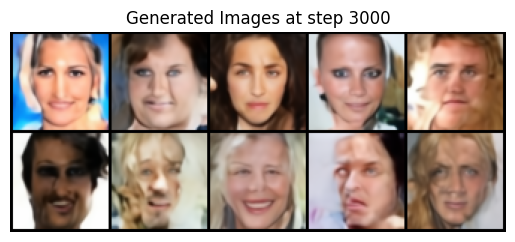

18:11:53 TRAINING Step [3100/87065]; Loss: 4.925279
18:12:11 TRAINING Step [3200/87065]; Loss: 4.921921
18:12:29 TRAINING Step [3300/87065]; Loss: 4.913780
18:12:46 TRAINING Step [3400/87065]; Loss: 4.908195
18:13:04 TRAINING Step [3500/87065]; Loss: 4.904384
18:13:22 TRAINING Step [3600/87065]; Loss: 4.898169
18:13:39 TRAINING Step [3700/87065]; Loss: 4.895160
18:13:57 TRAINING Step [3800/87065]; Loss: 4.886769
18:14:15 TRAINING Step [3900/87065]; Loss: 4.879240
18:14:33 TRAINING Step [4000/87065]; Loss: 4.876631
Checkpoint saved at step 4000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


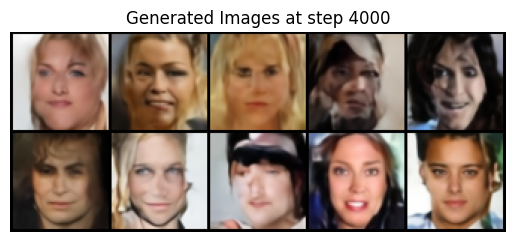

18:14:52 TRAINING Step [4100/87065]; Loss: 4.870111
18:15:09 TRAINING Step [4200/87065]; Loss: 4.865002
18:15:27 TRAINING Step [4300/87065]; Loss: 4.856360
18:15:45 TRAINING Step [4400/87065]; Loss: 4.853144
18:16:03 TRAINING Step [4500/87065]; Loss: 4.851244
18:16:20 TRAINING Step [4600/87065]; Loss: 4.843705
18:16:38 TRAINING Step [4700/87065]; Loss: 4.840414
18:16:56 TRAINING Step [4800/87065]; Loss: 4.840124
18:17:14 TRAINING Step [4900/87065]; Loss: 4.831123
18:17:31 TRAINING Step [5000/87065]; Loss: 4.828919
Checkpoint saved at step 5000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


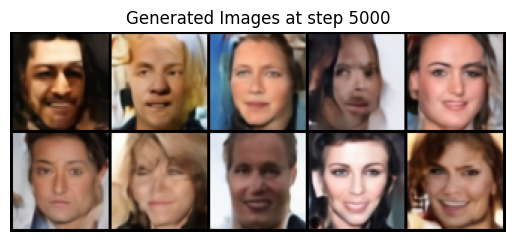

18:17:50 TRAINING Step [5100/87065]; Loss: 4.826364
18:18:08 TRAINING Step [5200/87065]; Loss: 4.824027
18:18:26 TRAINING Step [5300/87065]; Loss: 4.815550
18:18:44 TRAINING Step [5400/87065]; Loss: 4.814578
18:19:01 TRAINING Step [5500/87065]; Loss: 4.816767
18:19:19 TRAINING Step [5600/87065]; Loss: 4.808435
18:19:37 TRAINING Step [5700/87065]; Loss: 4.802587
18:19:54 TRAINING Step [5800/87065]; Loss: 4.802590
18:20:12 TRAINING Step [5900/87065]; Loss: 4.801657
18:20:30 TRAINING Step [6000/87065]; Loss: 4.796199
Checkpoint saved at step 6000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


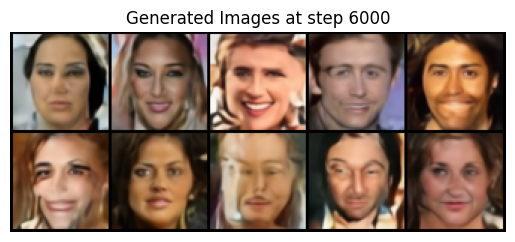

18:20:49 TRAINING Step [6100/87065]; Loss: 4.789428
18:21:07 TRAINING Step [6200/87065]; Loss: 4.788673
18:21:24 TRAINING Step [6300/87065]; Loss: 4.783635
18:21:42 TRAINING Step [6400/87065]; Loss: 4.781563
18:22:00 TRAINING Step [6500/87065]; Loss: 4.776156
18:22:17 TRAINING Step [6600/87065]; Loss: 4.779266
18:22:35 TRAINING Step [6700/87065]; Loss: 4.774327
18:22:53 TRAINING Step [6800/87065]; Loss: 4.774100
18:23:11 TRAINING Step [6900/87065]; Loss: 4.771046
18:23:28 TRAINING Step [7000/87065]; Loss: 4.767040
Checkpoint saved at step 7000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


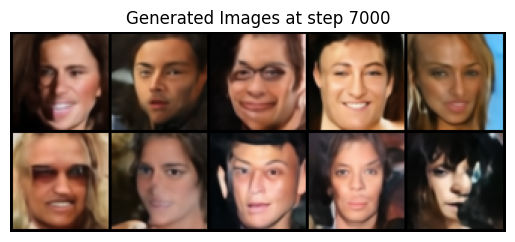

18:23:47 TRAINING Step [7100/87065]; Loss: 4.764563
18:24:05 TRAINING Step [7200/87065]; Loss: 4.762256
18:24:23 TRAINING Step [7300/87065]; Loss: 4.760119
18:24:41 TRAINING Step [7400/87065]; Loss: 4.758256
18:24:58 TRAINING Step [7500/87065]; Loss: 4.758132
18:25:16 TRAINING Step [7600/87065]; Loss: 4.754833
18:25:34 TRAINING Step [7700/87065]; Loss: 4.753058
18:25:51 TRAINING Step [7800/87065]; Loss: 4.747194
18:26:09 TRAINING Step [7900/87065]; Loss: 4.748918
18:26:27 TRAINING Step [8000/87065]; Loss: 4.741994
Checkpoint saved at step 8000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


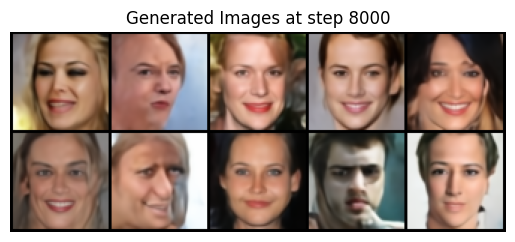

18:26:46 TRAINING Step [8100/87065]; Loss: 4.740790
18:27:04 TRAINING Step [8200/87065]; Loss: 4.739870
18:27:22 TRAINING Step [8300/87065]; Loss: 4.737660
18:27:39 TRAINING Step [8400/87065]; Loss: 4.738047
18:27:57 TRAINING Step [8500/87065]; Loss: 4.736026
18:28:15 TRAINING Step [8600/87065]; Loss: 4.737566
18:28:32 TRAINING Step [8700/87065]; Loss: 4.727979
18:28:50 TRAINING Step [8800/87065]; Loss: 4.723972
18:29:08 TRAINING Step [8900/87065]; Loss: 4.726481
18:29:25 TRAINING Step [9000/87065]; Loss: 4.726375
Checkpoint saved at step 9000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


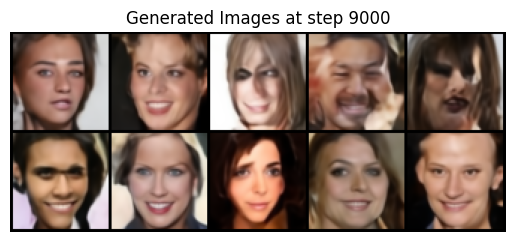

18:29:45 TRAINING Step [9100/87065]; Loss: 4.723672
18:30:02 TRAINING Step [9200/87065]; Loss: 4.723321
18:30:20 TRAINING Step [9300/87065]; Loss: 4.716777
18:30:38 TRAINING Step [9400/87065]; Loss: 4.720591
18:30:56 TRAINING Step [9500/87065]; Loss: 4.718396
18:31:13 TRAINING Step [9600/87065]; Loss: 4.710681
18:31:31 TRAINING Step [9700/87065]; Loss: 4.713752
18:31:49 TRAINING Step [9800/87065]; Loss: 4.708915
18:32:06 TRAINING Step [9900/87065]; Loss: 4.709347
18:32:24 TRAINING Step [10000/87065]; Loss: 4.710787
Checkpoint saved at step 10000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


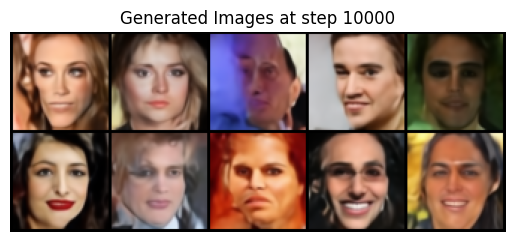

18:32:43 TRAINING Step [10100/87065]; Loss: 4.709697
18:33:01 TRAINING Step [10200/87065]; Loss: 4.704385
18:33:19 TRAINING Step [10300/87065]; Loss: 4.701950
18:33:36 TRAINING Step [10400/87065]; Loss: 4.704587
18:33:54 TRAINING Step [10500/87065]; Loss: 4.699280
18:34:12 TRAINING Step [10600/87065]; Loss: 4.697676
18:34:29 TRAINING Step [10700/87065]; Loss: 4.699812
18:34:47 TRAINING Step [10800/87065]; Loss: 4.697504
18:35:05 TRAINING Step [10900/87065]; Loss: 4.694326
18:35:22 TRAINING Step [11000/87065]; Loss: 4.694933
Checkpoint saved at step 11000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


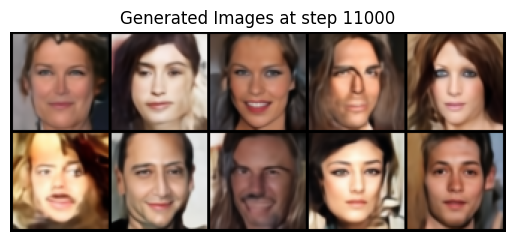

18:35:42 TRAINING Step [11100/87065]; Loss: 4.693780
18:36:00 TRAINING Step [11200/87065]; Loss: 4.689839
18:36:17 TRAINING Step [11300/87065]; Loss: 4.689046
18:36:35 TRAINING Step [11400/87065]; Loss: 4.687437
18:36:53 TRAINING Step [11500/87065]; Loss: 4.683829
18:37:10 TRAINING Step [11600/87065]; Loss: 4.685277
18:37:28 TRAINING Step [11700/87065]; Loss: 4.683060
18:37:46 TRAINING Step [11800/87065]; Loss: 4.682181
18:38:03 TRAINING Step [11900/87065]; Loss: 4.675808
18:38:21 TRAINING Step [12000/87065]; Loss: 4.682615
Checkpoint saved at step 12000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


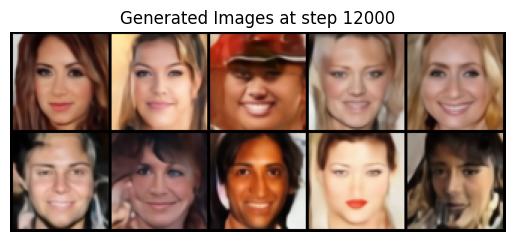

18:38:40 TRAINING Step [12100/87065]; Loss: 4.678146
18:38:58 TRAINING Step [12200/87065]; Loss: 4.681240
18:39:16 TRAINING Step [12300/87065]; Loss: 4.678312
18:39:34 TRAINING Step [12400/87065]; Loss: 4.678505
18:39:51 TRAINING Step [12500/87065]; Loss: 4.677337
18:40:09 TRAINING Step [12600/87065]; Loss: 4.675250
18:40:27 TRAINING Step [12700/87065]; Loss: 4.672306
18:40:45 TRAINING Step [12800/87065]; Loss: 4.667220
18:41:02 TRAINING Step [12900/87065]; Loss: 4.667180
18:41:20 TRAINING Step [13000/87065]; Loss: 4.665323
Checkpoint saved at step 13000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


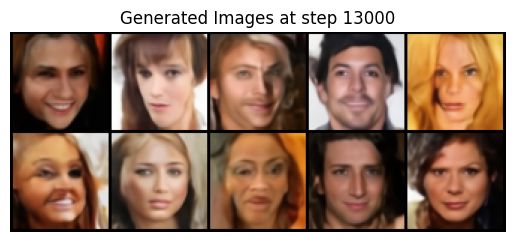

18:41:39 TRAINING Step [13100/87065]; Loss: 4.666323
18:41:57 TRAINING Step [13200/87065]; Loss: 4.670269
18:42:15 TRAINING Step [13300/87065]; Loss: 4.665660
18:42:32 TRAINING Step [13400/87065]; Loss: 4.661849
18:42:50 TRAINING Step [13500/87065]; Loss: 4.664590
18:43:08 TRAINING Step [13600/87065]; Loss: 4.660713
18:43:25 TRAINING Step [13700/87065]; Loss: 4.658716
18:43:43 TRAINING Step [13800/87065]; Loss: 4.663278
18:44:01 TRAINING Step [13900/87065]; Loss: 4.665758
18:44:18 TRAINING Step [14000/87065]; Loss: 4.659782
Checkpoint saved at step 14000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


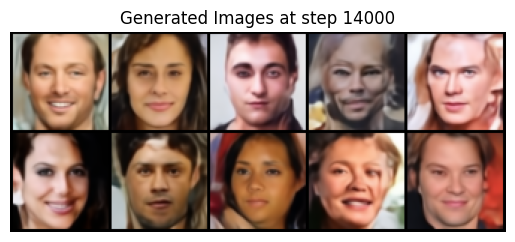

18:44:38 TRAINING Step [14100/87065]; Loss: 4.660689
18:44:55 TRAINING Step [14200/87065]; Loss: 4.656138
18:45:13 TRAINING Step [14300/87065]; Loss: 4.655617
18:45:31 TRAINING Step [14400/87065]; Loss: 4.653099
18:45:49 TRAINING Step [14500/87065]; Loss: 4.653072
18:46:06 TRAINING Step [14600/87065]; Loss: 4.651069
18:46:24 TRAINING Step [14700/87065]; Loss: 4.648613
18:46:42 TRAINING Step [14800/87065]; Loss: 4.652564
18:46:59 TRAINING Step [14900/87065]; Loss: 4.647837
18:47:17 TRAINING Step [15000/87065]; Loss: 4.649284
Checkpoint saved at step 15000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


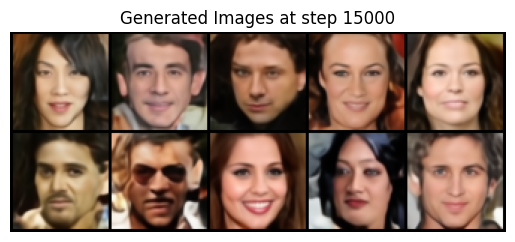

18:47:36 TRAINING Step [15100/87065]; Loss: 4.646026
18:47:54 TRAINING Step [15200/87065]; Loss: 4.647092
18:48:12 TRAINING Step [15300/87065]; Loss: 4.650581
18:48:29 TRAINING Step [15400/87065]; Loss: 4.646871
18:48:47 TRAINING Step [15500/87065]; Loss: 4.646926
18:49:05 TRAINING Step [15600/87065]; Loss: 4.642520
18:49:22 TRAINING Step [15700/87065]; Loss: 4.642647
18:49:40 TRAINING Step [15800/87065]; Loss: 4.642261
18:49:58 TRAINING Step [15900/87065]; Loss: 4.636928
18:50:16 TRAINING Step [16000/87065]; Loss: 4.637730
Checkpoint saved at step 16000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


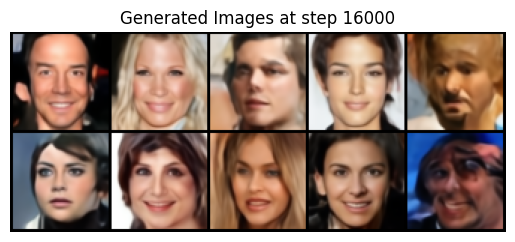

18:50:35 TRAINING Step [16100/87065]; Loss: 4.640376
18:50:53 TRAINING Step [16200/87065]; Loss: 4.638262
18:51:10 TRAINING Step [16300/87065]; Loss: 4.637227
18:51:28 TRAINING Step [16400/87065]; Loss: 4.633191
18:51:46 TRAINING Step [16500/87065]; Loss: 4.636269
18:52:04 TRAINING Step [16600/87065]; Loss: 4.638360
18:52:21 TRAINING Step [16700/87065]; Loss: 4.630390
18:52:39 TRAINING Step [16800/87065]; Loss: 4.637721
18:52:57 TRAINING Step [16900/87065]; Loss: 4.633567
18:53:14 TRAINING Step [17000/87065]; Loss: 4.633026
Checkpoint saved at step 17000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


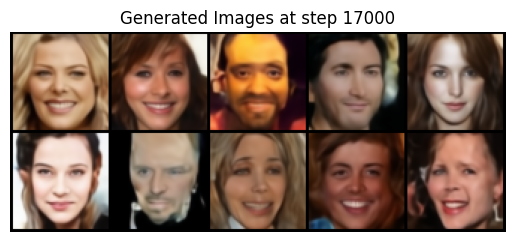

18:53:34 TRAINING Step [17100/87065]; Loss: 4.630884
18:53:51 TRAINING Step [17200/87065]; Loss: 4.630508
18:54:09 TRAINING Step [17300/87065]; Loss: 4.631658
18:54:27 TRAINING Step [17400/87065]; Loss: 4.626893
18:54:45 TRAINING Step [17500/87065]; Loss: 4.628471
18:55:02 TRAINING Step [17600/87065]; Loss: 4.625482
18:55:20 TRAINING Step [17700/87065]; Loss: 4.625612
18:55:38 TRAINING Step [17800/87065]; Loss: 4.625950
18:55:55 TRAINING Step [17900/87065]; Loss: 4.627940
18:56:13 TRAINING Step [18000/87065]; Loss: 4.625151
Checkpoint saved at step 18000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


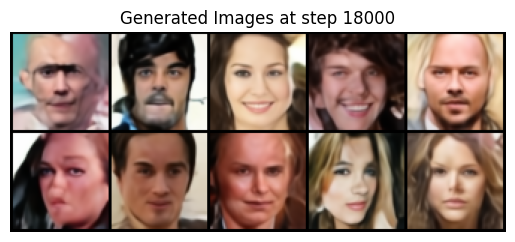

18:56:32 TRAINING Step [18100/87065]; Loss: 4.624794
18:56:50 TRAINING Step [18200/87065]; Loss: 4.621114
18:57:08 TRAINING Step [18300/87065]; Loss: 4.624790
18:57:25 TRAINING Step [18400/87065]; Loss: 4.621318
18:57:43 TRAINING Step [18500/87065]; Loss: 4.619864
18:58:01 TRAINING Step [18600/87065]; Loss: 4.619480
18:58:18 TRAINING Step [18700/87065]; Loss: 4.622182
18:58:36 TRAINING Step [18800/87065]; Loss: 4.615636
18:58:54 TRAINING Step [18900/87065]; Loss: 4.618131
18:59:12 TRAINING Step [19000/87065]; Loss: 4.616549
Checkpoint saved at step 19000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


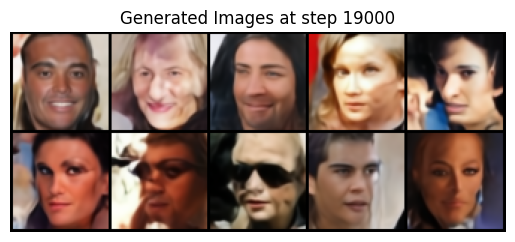

18:59:31 TRAINING Step [19100/87065]; Loss: 4.614864
18:59:49 TRAINING Step [19200/87065]; Loss: 4.615187
19:00:06 TRAINING Step [19300/87065]; Loss: 4.616582
19:00:24 TRAINING Step [19400/87065]; Loss: 4.614100
19:00:42 TRAINING Step [19500/87065]; Loss: 4.612099
19:01:00 TRAINING Step [19600/87065]; Loss: 4.613916
19:01:17 TRAINING Step [19700/87065]; Loss: 4.613321
19:01:35 TRAINING Step [19800/87065]; Loss: 4.610961
19:01:53 TRAINING Step [19900/87065]; Loss: 4.612376
19:02:10 TRAINING Step [20000/87065]; Loss: 4.608286
Checkpoint saved at step 20000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


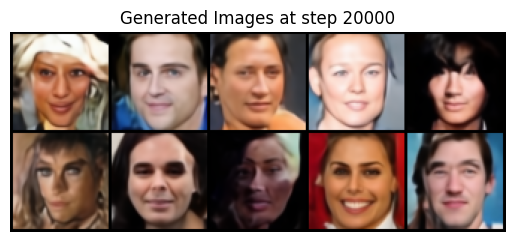

19:02:30 TRAINING Step [20100/87065]; Loss: 4.609656
19:02:47 TRAINING Step [20200/87065]; Loss: 4.613049
19:03:05 TRAINING Step [20300/87065]; Loss: 4.610701
19:03:23 TRAINING Step [20400/87065]; Loss: 4.610491
19:03:40 TRAINING Step [20500/87065]; Loss: 4.608981
19:03:58 TRAINING Step [20600/87065]; Loss: 4.609513
19:04:16 TRAINING Step [20700/87065]; Loss: 4.603379
19:04:34 TRAINING Step [20800/87065]; Loss: 4.603827
19:04:51 TRAINING Step [20900/87065]; Loss: 4.601955
19:05:09 TRAINING Step [21000/87065]; Loss: 4.605733
Checkpoint saved at step 21000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


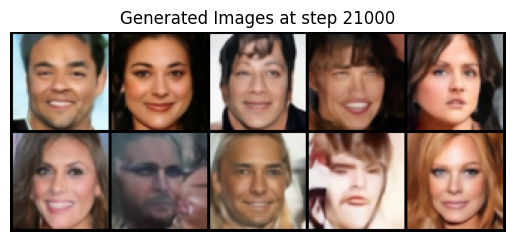

19:05:28 TRAINING Step [21100/87065]; Loss: 4.601552
19:05:46 TRAINING Step [21200/87065]; Loss: 4.604079
19:06:04 TRAINING Step [21300/87065]; Loss: 4.601865
19:06:21 TRAINING Step [21400/87065]; Loss: 4.605684
19:06:39 TRAINING Step [21500/87065]; Loss: 4.604828
19:06:57 TRAINING Step [21600/87065]; Loss: 4.604069
19:07:14 TRAINING Step [21700/87065]; Loss: 4.601929
19:07:32 TRAINING Step [21800/87065]; Loss: 4.601538
19:07:50 TRAINING Step [21900/87065]; Loss: 4.599390
19:08:07 TRAINING Step [22000/87065]; Loss: 4.603482
Checkpoint saved at step 22000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


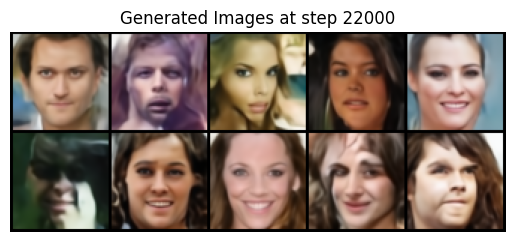

19:08:27 TRAINING Step [22100/87065]; Loss: 4.595228
19:08:45 TRAINING Step [22200/87065]; Loss: 4.597164
19:09:02 TRAINING Step [22300/87065]; Loss: 4.595917
19:09:20 TRAINING Step [22400/87065]; Loss: 4.595259
19:09:38 TRAINING Step [22500/87065]; Loss: 4.598061
19:09:55 TRAINING Step [22600/87065]; Loss: 4.597134
19:10:13 TRAINING Step [22700/87065]; Loss: 4.596558
19:10:31 TRAINING Step [22800/87065]; Loss: 4.594450
19:10:49 TRAINING Step [22900/87065]; Loss: 4.595266
19:11:06 TRAINING Step [23000/87065]; Loss: 4.597144
Checkpoint saved at step 23000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


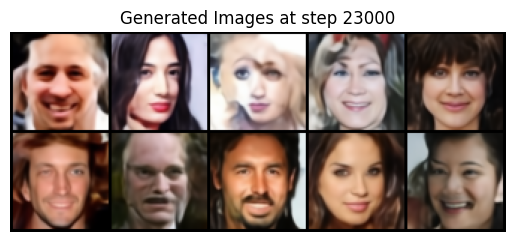

19:11:25 TRAINING Step [23100/87065]; Loss: 4.594432
19:11:43 TRAINING Step [23200/87065]; Loss: 4.593342
19:12:01 TRAINING Step [23300/87065]; Loss: 4.590553
19:12:19 TRAINING Step [23400/87065]; Loss: 4.595328
19:12:36 TRAINING Step [23500/87065]; Loss: 4.589176
19:12:54 TRAINING Step [23600/87065]; Loss: 4.593893
19:13:12 TRAINING Step [23700/87065]; Loss: 4.589005
19:13:30 TRAINING Step [23800/87065]; Loss: 4.589186
19:13:47 TRAINING Step [23900/87065]; Loss: 4.590252
19:14:05 TRAINING Step [24000/87065]; Loss: 4.589097
Checkpoint saved at step 24000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


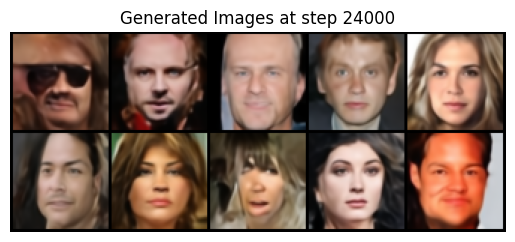

19:14:24 TRAINING Step [24100/87065]; Loss: 4.588149
19:14:42 TRAINING Step [24200/87065]; Loss: 4.589060
19:15:00 TRAINING Step [24300/87065]; Loss: 4.587443
19:15:17 TRAINING Step [24400/87065]; Loss: 4.587096
19:15:35 TRAINING Step [24500/87065]; Loss: 4.584648
19:15:53 TRAINING Step [24600/87065]; Loss: 4.588807
19:16:10 TRAINING Step [24700/87065]; Loss: 4.582049
19:16:28 TRAINING Step [24800/87065]; Loss: 4.582793
19:16:46 TRAINING Step [24900/87065]; Loss: 4.586700
19:17:04 TRAINING Step [25000/87065]; Loss: 4.585075
Checkpoint saved at step 25000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


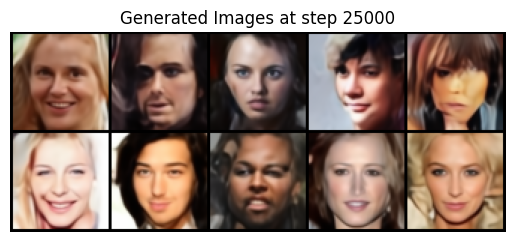

19:17:23 TRAINING Step [25100/87065]; Loss: 4.584570
19:17:41 TRAINING Step [25200/87065]; Loss: 4.581660
19:17:58 TRAINING Step [25300/87065]; Loss: 4.587251
19:18:16 TRAINING Step [25400/87065]; Loss: 4.578673
19:18:34 TRAINING Step [25500/87065]; Loss: 4.575910
19:18:52 TRAINING Step [25600/87065]; Loss: 4.579545
19:19:09 TRAINING Step [25700/87065]; Loss: 4.580474
19:19:27 TRAINING Step [25800/87065]; Loss: 4.578364
19:19:45 TRAINING Step [25900/87065]; Loss: 4.580357
19:20:02 TRAINING Step [26000/87065]; Loss: 4.579838
Checkpoint saved at step 26000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


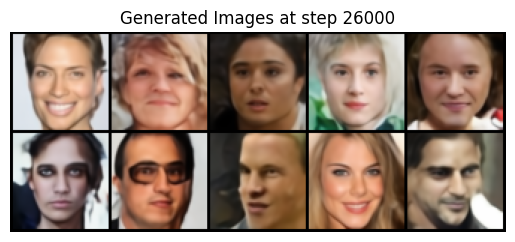

19:20:22 TRAINING Step [26100/87065]; Loss: 4.580372
19:20:39 TRAINING Step [26200/87065]; Loss: 4.585025
19:20:57 TRAINING Step [26300/87065]; Loss: 4.576681
19:21:15 TRAINING Step [26400/87065]; Loss: 4.579593
19:21:32 TRAINING Step [26500/87065]; Loss: 4.577061
19:21:50 TRAINING Step [26600/87065]; Loss: 4.578316
19:22:08 TRAINING Step [26700/87065]; Loss: 4.582264
19:22:25 TRAINING Step [26800/87065]; Loss: 4.574757
19:22:43 TRAINING Step [26900/87065]; Loss: 4.579219
19:23:01 TRAINING Step [27000/87065]; Loss: 4.570936
Checkpoint saved at step 27000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


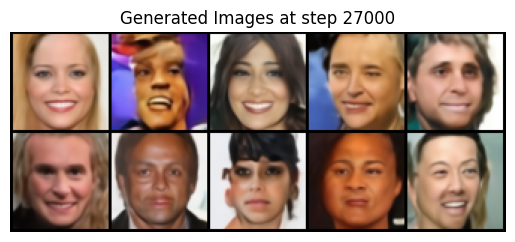

19:23:20 TRAINING Step [27100/87065]; Loss: 4.573856
19:23:38 TRAINING Step [27200/87065]; Loss: 4.574501
19:23:56 TRAINING Step [27300/87065]; Loss: 4.572550
19:24:13 TRAINING Step [27400/87065]; Loss: 4.569493
19:24:31 TRAINING Step [27500/87065]; Loss: 4.577641
19:24:49 TRAINING Step [27600/87065]; Loss: 4.570731
19:25:06 TRAINING Step [27700/87065]; Loss: 4.573932
19:25:24 TRAINING Step [27800/87065]; Loss: 4.570767
19:25:42 TRAINING Step [27900/87065]; Loss: 4.574044
19:26:00 TRAINING Step [28000/87065]; Loss: 4.574947
Checkpoint saved at step 28000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


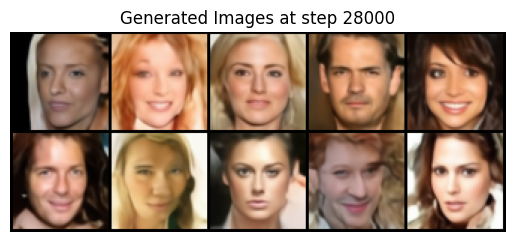

19:26:19 TRAINING Step [28100/87065]; Loss: 4.572496
19:26:36 TRAINING Step [28200/87065]; Loss: 4.571172
19:26:54 TRAINING Step [28300/87065]; Loss: 4.573806
19:27:12 TRAINING Step [28400/87065]; Loss: 4.574408
19:27:30 TRAINING Step [28500/87065]; Loss: 4.568305
19:27:47 TRAINING Step [28600/87065]; Loss: 4.566086
19:28:05 TRAINING Step [28700/87065]; Loss: 4.567354
19:28:23 TRAINING Step [28800/87065]; Loss: 4.566395
19:28:41 TRAINING Step [28900/87065]; Loss: 4.569584
19:28:58 TRAINING Step [29000/87065]; Loss: 4.564541
Checkpoint saved at step 29000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


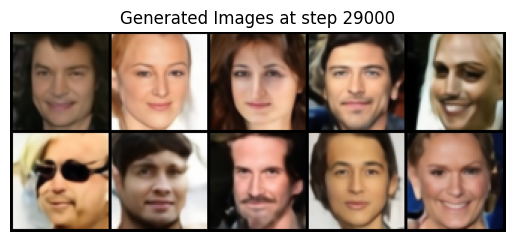

19:29:17 TRAINING Step [29100/87065]; Loss: 4.567291
19:29:35 TRAINING Step [29200/87065]; Loss: 4.564246
19:29:53 TRAINING Step [29300/87065]; Loss: 4.569808
19:30:11 TRAINING Step [29400/87065]; Loss: 4.567245
19:30:28 TRAINING Step [29500/87065]; Loss: 4.565484
19:30:46 TRAINING Step [29600/87065]; Loss: 4.565865
19:31:04 TRAINING Step [29700/87065]; Loss: 4.566989
19:31:21 TRAINING Step [29800/87065]; Loss: 4.568468
19:31:39 TRAINING Step [29900/87065]; Loss: 4.567584
19:31:57 TRAINING Step [30000/87065]; Loss: 4.564401
Checkpoint saved at step 30000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


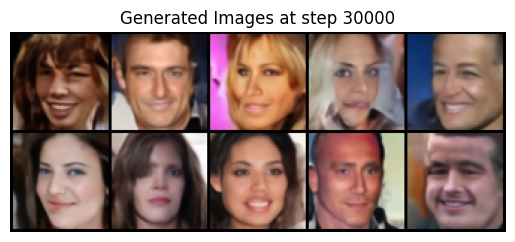

19:32:16 TRAINING Step [30100/87065]; Loss: 4.564476
19:32:34 TRAINING Step [30200/87065]; Loss: 4.561711
19:32:52 TRAINING Step [30300/87065]; Loss: 4.559247
19:33:09 TRAINING Step [30400/87065]; Loss: 4.562535
19:33:27 TRAINING Step [30500/87065]; Loss: 4.559118
19:33:45 TRAINING Step [30600/87065]; Loss: 4.562505
19:34:02 TRAINING Step [30700/87065]; Loss: 4.557790
19:34:20 TRAINING Step [30800/87065]; Loss: 4.560653
19:34:38 TRAINING Step [30900/87065]; Loss: 4.564642
19:34:55 TRAINING Step [31000/87065]; Loss: 4.562185
Checkpoint saved at step 31000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


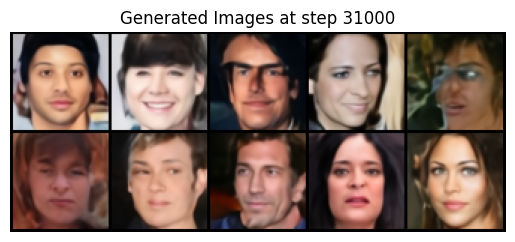

19:35:15 TRAINING Step [31100/87065]; Loss: 4.560621
19:35:32 TRAINING Step [31200/87065]; Loss: 4.561787
19:35:50 TRAINING Step [31300/87065]; Loss: 4.559144
19:36:08 TRAINING Step [31400/87065]; Loss: 4.557863
19:36:25 TRAINING Step [31500/87065]; Loss: 4.562931
19:36:43 TRAINING Step [31600/87065]; Loss: 4.561002
19:37:01 TRAINING Step [31700/87065]; Loss: 4.557616
19:37:19 TRAINING Step [31800/87065]; Loss: 4.556355
19:37:36 TRAINING Step [31900/87065]; Loss: 4.554349
19:37:54 TRAINING Step [32000/87065]; Loss: 4.555252
Checkpoint saved at step 32000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


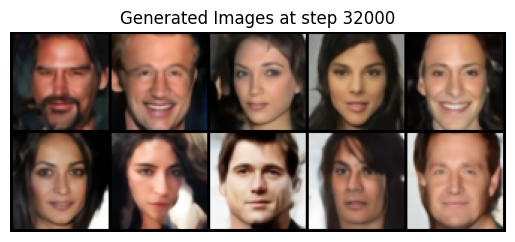

19:38:13 TRAINING Step [32100/87065]; Loss: 4.557461
19:38:31 TRAINING Step [32200/87065]; Loss: 4.552407
19:38:49 TRAINING Step [32300/87065]; Loss: 4.559521
19:39:06 TRAINING Step [32400/87065]; Loss: 4.555288
19:39:24 TRAINING Step [32500/87065]; Loss: 4.558097
19:39:42 TRAINING Step [32600/87065]; Loss: 4.556839
19:40:00 TRAINING Step [32700/87065]; Loss: 4.557549
19:40:17 TRAINING Step [32800/87065]; Loss: 4.553252
19:40:35 TRAINING Step [32900/87065]; Loss: 4.559368
19:40:53 TRAINING Step [33000/87065]; Loss: 4.550525
Checkpoint saved at step 33000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


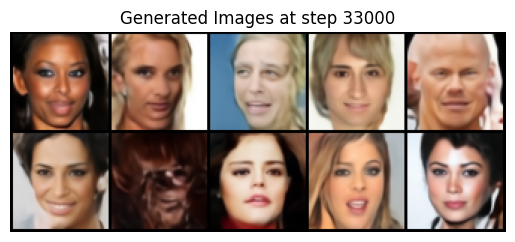

19:41:12 TRAINING Step [33100/87065]; Loss: 4.556247
19:41:30 TRAINING Step [33200/87065]; Loss: 4.557390
19:41:47 TRAINING Step [33300/87065]; Loss: 4.550995
19:42:05 TRAINING Step [33400/87065]; Loss: 4.550912
19:42:23 TRAINING Step [33500/87065]; Loss: 4.550987
19:42:41 TRAINING Step [33600/87065]; Loss: 4.554665
19:42:58 TRAINING Step [33700/87065]; Loss: 4.548299
19:43:16 TRAINING Step [33800/87065]; Loss: 4.551511
19:43:34 TRAINING Step [33900/87065]; Loss: 4.550123
19:43:51 TRAINING Step [34000/87065]; Loss: 4.550296
Checkpoint saved at step 34000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


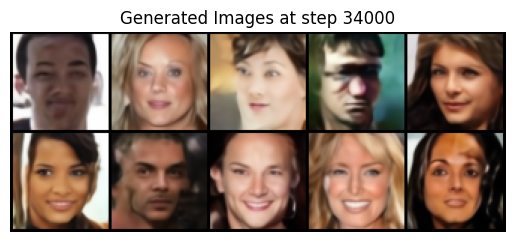

19:44:11 TRAINING Step [34100/87065]; Loss: 4.554630
19:44:28 TRAINING Step [34200/87065]; Loss: 4.551243
19:44:46 TRAINING Step [34300/87065]; Loss: 4.552969
19:45:04 TRAINING Step [34400/87065]; Loss: 4.550292
19:45:21 TRAINING Step [34500/87065]; Loss: 4.552252
19:45:39 TRAINING Step [34600/87065]; Loss: 4.544423
19:45:57 TRAINING Step [34700/87065]; Loss: 4.552326
19:46:15 TRAINING Step [34800/87065]; Loss: 4.547840
19:46:32 TRAINING Step [34900/87065]; Loss: 4.550045
19:46:50 TRAINING Step [35000/87065]; Loss: 4.546655
Checkpoint saved at step 35000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


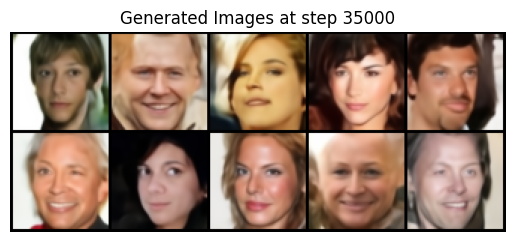

19:47:09 TRAINING Step [35100/87065]; Loss: 4.544508
19:47:27 TRAINING Step [35200/87065]; Loss: 4.545939
19:47:45 TRAINING Step [35300/87065]; Loss: 4.544701
19:48:03 TRAINING Step [35400/87065]; Loss: 4.542956
19:48:20 TRAINING Step [35500/87065]; Loss: 4.544258
19:48:38 TRAINING Step [35600/87065]; Loss: 4.549204
19:48:56 TRAINING Step [35700/87065]; Loss: 4.547861
19:49:13 TRAINING Step [35800/87065]; Loss: 4.546009
19:49:31 TRAINING Step [35900/87065]; Loss: 4.546366
19:49:49 TRAINING Step [36000/87065]; Loss: 4.544825
Checkpoint saved at step 36000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


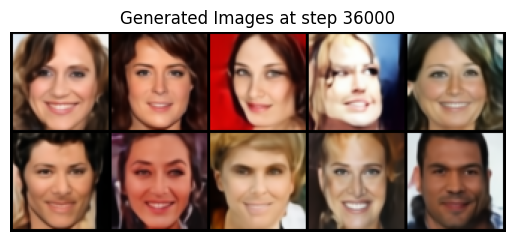

19:50:08 TRAINING Step [36100/87065]; Loss: 4.549527
19:50:26 TRAINING Step [36200/87065]; Loss: 4.544188
19:50:43 TRAINING Step [36300/87065]; Loss: 4.547845
19:51:01 TRAINING Step [36400/87065]; Loss: 4.546142
19:51:19 TRAINING Step [36500/87065]; Loss: 4.542517
19:51:37 TRAINING Step [36600/87065]; Loss: 4.543099
19:51:54 TRAINING Step [36700/87065]; Loss: 4.540546
19:52:12 TRAINING Step [36800/87065]; Loss: 4.544058
19:52:30 TRAINING Step [36900/87065]; Loss: 4.541857
19:52:48 TRAINING Step [37000/87065]; Loss: 4.543780
Checkpoint saved at step 37000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


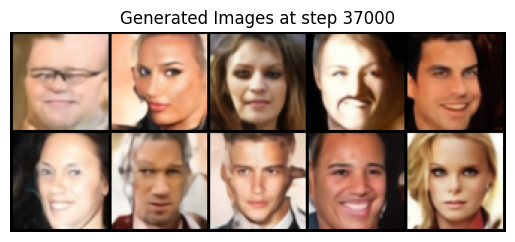

19:53:07 TRAINING Step [37100/87065]; Loss: 4.540143
19:53:24 TRAINING Step [37200/87065]; Loss: 4.540949
19:53:42 TRAINING Step [37300/87065]; Loss: 4.544215
19:54:00 TRAINING Step [37400/87065]; Loss: 4.542331
19:54:18 TRAINING Step [37500/87065]; Loss: 4.543826
19:54:35 TRAINING Step [37600/87065]; Loss: 4.538885
19:54:53 TRAINING Step [37700/87065]; Loss: 4.541624
19:55:11 TRAINING Step [37800/87065]; Loss: 4.542993
19:55:28 TRAINING Step [37900/87065]; Loss: 4.541456
19:55:46 TRAINING Step [38000/87065]; Loss: 4.541772
Checkpoint saved at step 38000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


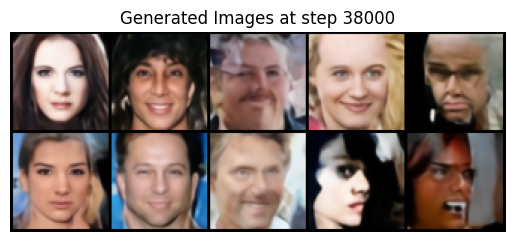

19:56:05 TRAINING Step [38100/87065]; Loss: 4.534049
19:56:23 TRAINING Step [38200/87065]; Loss: 4.535494
19:56:41 TRAINING Step [38300/87065]; Loss: 4.539399
19:56:59 TRAINING Step [38400/87065]; Loss: 4.535535
19:57:16 TRAINING Step [38500/87065]; Loss: 4.538523
19:57:34 TRAINING Step [38600/87065]; Loss: 4.542320
19:57:52 TRAINING Step [38700/87065]; Loss: 4.537232
19:58:09 TRAINING Step [38800/87065]; Loss: 4.536760
19:58:27 TRAINING Step [38900/87065]; Loss: 4.535908
19:58:45 TRAINING Step [39000/87065]; Loss: 4.540498
Checkpoint saved at step 39000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


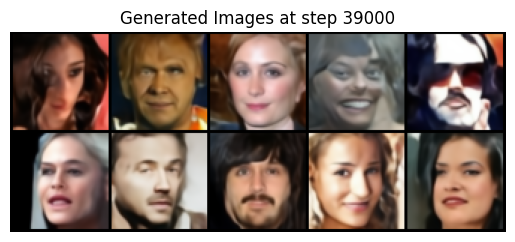

19:59:04 TRAINING Step [39100/87065]; Loss: 4.536487
19:59:22 TRAINING Step [39200/87065]; Loss: 4.538677
19:59:39 TRAINING Step [39300/87065]; Loss: 4.535403
19:59:57 TRAINING Step [39400/87065]; Loss: 4.540204
20:00:15 TRAINING Step [39500/87065]; Loss: 4.542366
20:00:33 TRAINING Step [39600/87065]; Loss: 4.536974
20:00:50 TRAINING Step [39700/87065]; Loss: 4.535436
20:01:08 TRAINING Step [39800/87065]; Loss: 4.533840
20:01:26 TRAINING Step [39900/87065]; Loss: 4.528872
20:01:43 TRAINING Step [40000/87065]; Loss: 4.535461
Checkpoint saved at step 40000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


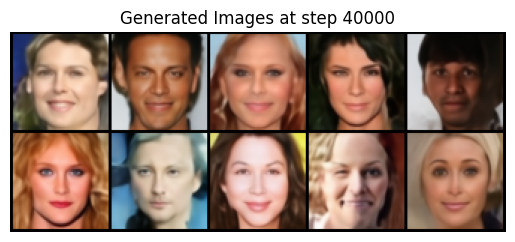

20:02:03 TRAINING Step [40100/87065]; Loss: 4.536890
20:02:20 TRAINING Step [40200/87065]; Loss: 4.533244
20:02:38 TRAINING Step [40300/87065]; Loss: 4.535584
20:02:56 TRAINING Step [40400/87065]; Loss: 4.534353
20:03:13 TRAINING Step [40500/87065]; Loss: 4.531386
20:03:31 TRAINING Step [40600/87065]; Loss: 4.537609
20:03:49 TRAINING Step [40700/87065]; Loss: 4.537789
20:04:07 TRAINING Step [40800/87065]; Loss: 4.531470
20:04:24 TRAINING Step [40900/87065]; Loss: 4.531873
20:04:42 TRAINING Step [41000/87065]; Loss: 4.535442
Checkpoint saved at step 41000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


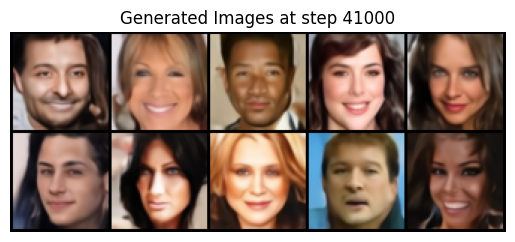

20:05:01 TRAINING Step [41100/87065]; Loss: 4.532328
20:05:19 TRAINING Step [41200/87065]; Loss: 4.530237
20:05:37 TRAINING Step [41300/87065]; Loss: 4.530035
20:05:55 TRAINING Step [41400/87065]; Loss: 4.530506
20:06:12 TRAINING Step [41500/87065]; Loss: 4.531227
20:06:30 TRAINING Step [41600/87065]; Loss: 4.532239
20:06:48 TRAINING Step [41700/87065]; Loss: 4.527960
20:07:05 TRAINING Step [41800/87065]; Loss: 4.535789
20:07:23 TRAINING Step [41900/87065]; Loss: 4.530024
20:07:41 TRAINING Step [42000/87065]; Loss: 4.529379
Checkpoint saved at step 42000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


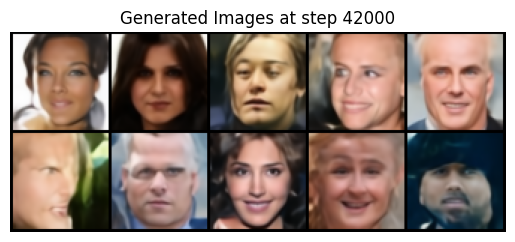

20:08:00 TRAINING Step [42100/87065]; Loss: 4.534229
20:08:18 TRAINING Step [42200/87065]; Loss: 4.528546
20:08:35 TRAINING Step [42300/87065]; Loss: 4.533873
20:08:53 TRAINING Step [42400/87065]; Loss: 4.525700
20:09:11 TRAINING Step [42500/87065]; Loss: 4.532946
20:09:28 TRAINING Step [42600/87065]; Loss: 4.528328
20:09:46 TRAINING Step [42700/87065]; Loss: 4.528731
20:10:04 TRAINING Step [42800/87065]; Loss: 4.526023
20:10:22 TRAINING Step [42900/87065]; Loss: 4.527545
20:10:39 TRAINING Step [43000/87065]; Loss: 4.525720
Checkpoint saved at step 43000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


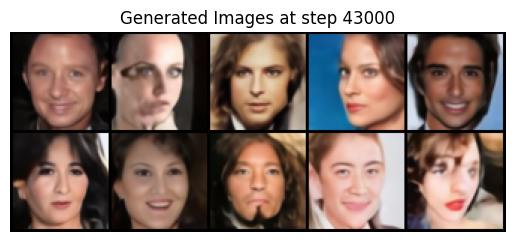

20:10:59 TRAINING Step [43100/87065]; Loss: 4.524042
20:11:16 TRAINING Step [43200/87065]; Loss: 4.527646
20:11:34 TRAINING Step [43300/87065]; Loss: 4.527691
20:11:52 TRAINING Step [43400/87065]; Loss: 4.528701
20:12:09 TRAINING Step [43500/87065]; Loss: 4.527036
20:12:27 TRAINING Step [43600/87065]; Loss: 4.528083
20:12:45 TRAINING Step [43700/87065]; Loss: 4.525718
20:13:03 TRAINING Step [43800/87065]; Loss: 4.529366
20:13:20 TRAINING Step [43900/87065]; Loss: 4.526376
20:13:38 TRAINING Step [44000/87065]; Loss: 4.525940
Checkpoint saved at step 44000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


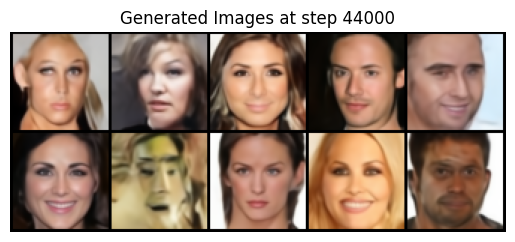

20:13:57 TRAINING Step [44100/87065]; Loss: 4.528180
20:14:15 TRAINING Step [44200/87065]; Loss: 4.528441
20:14:33 TRAINING Step [44300/87065]; Loss: 4.527106
20:14:50 TRAINING Step [44400/87065]; Loss: 4.525203
20:15:08 TRAINING Step [44500/87065]; Loss: 4.524791
20:15:26 TRAINING Step [44600/87065]; Loss: 4.519585
20:15:44 TRAINING Step [44700/87065]; Loss: 4.524380
20:16:01 TRAINING Step [44800/87065]; Loss: 4.524955
20:16:19 TRAINING Step [44900/87065]; Loss: 4.521081
20:16:37 TRAINING Step [45000/87065]; Loss: 4.522889
Checkpoint saved at step 45000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


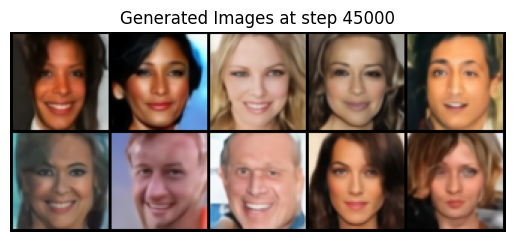

20:16:56 TRAINING Step [45100/87065]; Loss: 4.524542
20:17:14 TRAINING Step [45200/87065]; Loss: 4.525566
20:17:31 TRAINING Step [45300/87065]; Loss: 4.520097
20:17:49 TRAINING Step [45400/87065]; Loss: 4.524877
20:18:07 TRAINING Step [45500/87065]; Loss: 4.524847
20:18:24 TRAINING Step [45600/87065]; Loss: 4.528155
20:18:42 TRAINING Step [45700/87065]; Loss: 4.524672
20:19:00 TRAINING Step [45800/87065]; Loss: 4.522972
20:19:17 TRAINING Step [45900/87065]; Loss: 4.521213
20:19:35 TRAINING Step [46000/87065]; Loss: 4.518511
Checkpoint saved at step 46000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


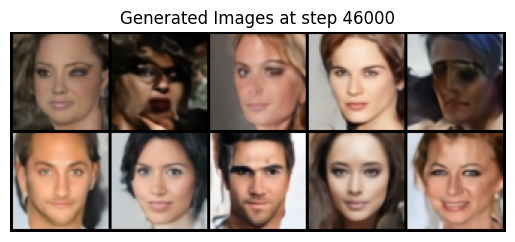

20:19:55 TRAINING Step [46100/87065]; Loss: 4.520209
20:20:12 TRAINING Step [46200/87065]; Loss: 4.521848
20:20:30 TRAINING Step [46300/87065]; Loss: 4.519116
20:20:48 TRAINING Step [46400/87065]; Loss: 4.519746
20:21:05 TRAINING Step [46500/87065]; Loss: 4.517402
20:21:23 TRAINING Step [46600/87065]; Loss: 4.520362
20:21:41 TRAINING Step [46700/87065]; Loss: 4.527570
20:21:58 TRAINING Step [46800/87065]; Loss: 4.522360
20:22:16 TRAINING Step [46900/87065]; Loss: 4.517474
20:22:34 TRAINING Step [47000/87065]; Loss: 4.520792
Checkpoint saved at step 47000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


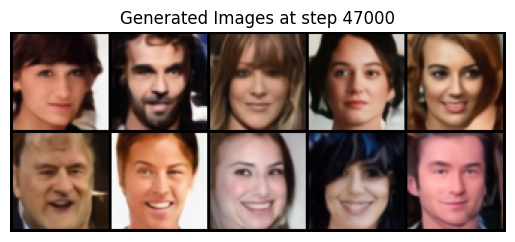

20:22:53 TRAINING Step [47100/87065]; Loss: 4.523153
20:23:11 TRAINING Step [47200/87065]; Loss: 4.520335
20:23:28 TRAINING Step [47300/87065]; Loss: 4.517748
20:23:46 TRAINING Step [47400/87065]; Loss: 4.524427
20:24:04 TRAINING Step [47500/87065]; Loss: 4.519435
20:24:22 TRAINING Step [47600/87065]; Loss: 4.517331
20:24:39 TRAINING Step [47700/87065]; Loss: 4.516788
20:24:57 TRAINING Step [47800/87065]; Loss: 4.520115
20:25:15 TRAINING Step [47900/87065]; Loss: 4.515444
20:25:33 TRAINING Step [48000/87065]; Loss: 4.522117
Checkpoint saved at step 48000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


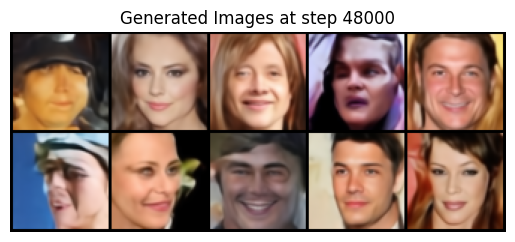

20:25:52 TRAINING Step [48100/87065]; Loss: 4.517880
20:26:09 TRAINING Step [48200/87065]; Loss: 4.514812
20:26:27 TRAINING Step [48300/87065]; Loss: 4.519124
20:26:45 TRAINING Step [48400/87065]; Loss: 4.518007
20:27:03 TRAINING Step [48500/87065]; Loss: 4.515055
20:27:20 TRAINING Step [48600/87065]; Loss: 4.517710
20:27:38 TRAINING Step [48700/87065]; Loss: 4.513647
20:27:56 TRAINING Step [48800/87065]; Loss: 4.521444
20:28:13 TRAINING Step [48900/87065]; Loss: 4.516478
20:28:31 TRAINING Step [49000/87065]; Loss: 4.517611
Checkpoint saved at step 49000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


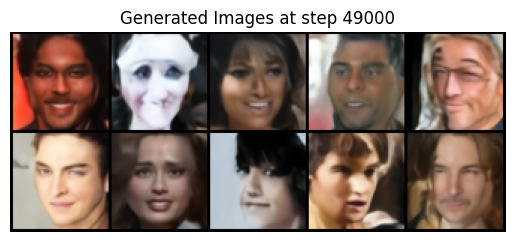

20:28:50 TRAINING Step [49100/87065]; Loss: 4.517627
20:29:08 TRAINING Step [49200/87065]; Loss: 4.512200
20:29:26 TRAINING Step [49300/87065]; Loss: 4.512338
20:29:44 TRAINING Step [49400/87065]; Loss: 4.515827
20:30:01 TRAINING Step [49500/87065]; Loss: 4.517111
20:30:19 TRAINING Step [49600/87065]; Loss: 4.513747
20:30:37 TRAINING Step [49700/87065]; Loss: 4.518821
20:30:54 TRAINING Step [49800/87065]; Loss: 4.514764
20:31:12 TRAINING Step [49900/87065]; Loss: 4.512481
20:31:30 TRAINING Step [50000/87065]; Loss: 4.515842
Checkpoint saved at step 50000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


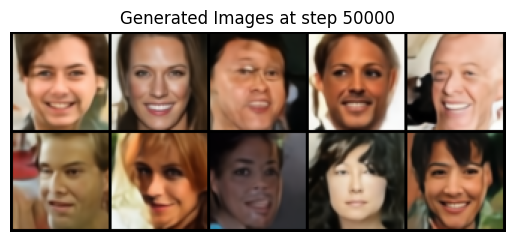

20:31:49 TRAINING Step [50100/87065]; Loss: 4.516236
20:32:07 TRAINING Step [50200/87065]; Loss: 4.516086
20:32:24 TRAINING Step [50300/87065]; Loss: 4.514159
20:32:42 TRAINING Step [50400/87065]; Loss: 4.513128
20:33:00 TRAINING Step [50500/87065]; Loss: 4.513744
20:33:17 TRAINING Step [50600/87065]; Loss: 4.517032
20:33:35 TRAINING Step [50700/87065]; Loss: 4.512542
20:33:53 TRAINING Step [50800/87065]; Loss: 4.514609
20:34:11 TRAINING Step [50900/87065]; Loss: 4.508783
20:34:29 TRAINING Step [51000/87065]; Loss: 4.510904
Checkpoint saved at step 51000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


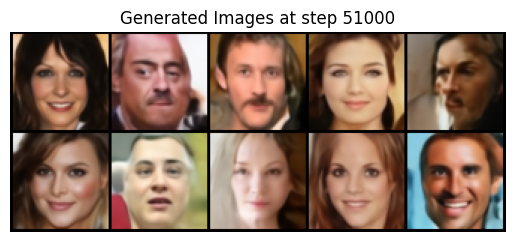

20:34:48 TRAINING Step [51100/87065]; Loss: 4.508506
20:35:05 TRAINING Step [51200/87065]; Loss: 4.512542
20:35:23 TRAINING Step [51300/87065]; Loss: 4.515619
20:35:41 TRAINING Step [51400/87065]; Loss: 4.511959
20:35:59 TRAINING Step [51500/87065]; Loss: 4.510850
20:36:16 TRAINING Step [51600/87065]; Loss: 4.517503
20:36:34 TRAINING Step [51700/87065]; Loss: 4.508882
20:36:52 TRAINING Step [51800/87065]; Loss: 4.510270
20:37:09 TRAINING Step [51900/87065]; Loss: 4.515747
20:37:27 TRAINING Step [52000/87065]; Loss: 4.510931
Checkpoint saved at step 52000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


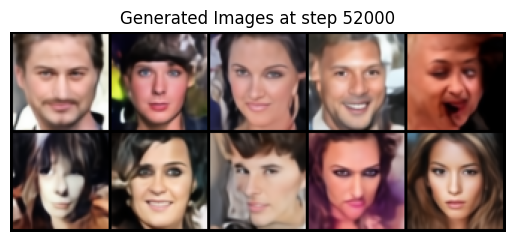

20:37:46 TRAINING Step [52100/87065]; Loss: 4.513834
20:38:04 TRAINING Step [52200/87065]; Loss: 4.509316
20:38:22 TRAINING Step [52300/87065]; Loss: 4.510008
20:38:40 TRAINING Step [52400/87065]; Loss: 4.508665
20:38:57 TRAINING Step [52500/87065]; Loss: 4.507314
20:39:15 TRAINING Step [52600/87065]; Loss: 4.508612
20:39:33 TRAINING Step [52700/87065]; Loss: 4.511517
20:39:50 TRAINING Step [52800/87065]; Loss: 4.508519
20:40:08 TRAINING Step [52900/87065]; Loss: 4.506323
20:40:26 TRAINING Step [53000/87065]; Loss: 4.510102
Checkpoint saved at step 53000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


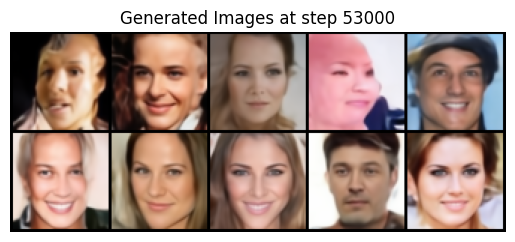

20:40:45 TRAINING Step [53100/87065]; Loss: 4.509186
20:41:03 TRAINING Step [53200/87065]; Loss: 4.508786
20:41:20 TRAINING Step [53300/87065]; Loss: 4.508229
20:41:38 TRAINING Step [53400/87065]; Loss: 4.509821
20:41:56 TRAINING Step [53500/87065]; Loss: 4.508927
20:42:13 TRAINING Step [53600/87065]; Loss: 4.511551
20:42:31 TRAINING Step [53700/87065]; Loss: 4.511251
20:42:49 TRAINING Step [53800/87065]; Loss: 4.513338
20:43:07 TRAINING Step [53900/87065]; Loss: 4.505549
20:43:24 TRAINING Step [54000/87065]; Loss: 4.509658
Checkpoint saved at step 54000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


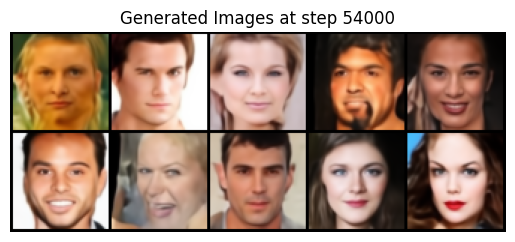

20:43:44 TRAINING Step [54100/87065]; Loss: 4.506410
20:44:01 TRAINING Step [54200/87065]; Loss: 4.503965
20:44:19 TRAINING Step [54300/87065]; Loss: 4.509793
20:44:37 TRAINING Step [54400/87065]; Loss: 4.509294
20:44:55 TRAINING Step [54500/87065]; Loss: 4.505102
20:45:12 TRAINING Step [54600/87065]; Loss: 4.505261
20:45:30 TRAINING Step [54700/87065]; Loss: 4.509106
20:45:48 TRAINING Step [54800/87065]; Loss: 4.501912
20:46:05 TRAINING Step [54900/87065]; Loss: 4.509781
20:46:23 TRAINING Step [55000/87065]; Loss: 4.508771
Checkpoint saved at step 55000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


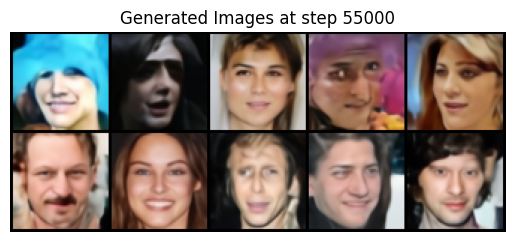

20:46:42 TRAINING Step [55100/87065]; Loss: 4.508579
20:47:00 TRAINING Step [55200/87065]; Loss: 4.507101
20:47:18 TRAINING Step [55300/87065]; Loss: 4.503146
20:47:35 TRAINING Step [55400/87065]; Loss: 4.506139
20:47:53 TRAINING Step [55500/87065]; Loss: 4.504911
20:48:11 TRAINING Step [55600/87065]; Loss: 4.503880
20:48:29 TRAINING Step [55700/87065]; Loss: 4.503980
20:48:46 TRAINING Step [55800/87065]; Loss: 4.507271
20:49:04 TRAINING Step [55900/87065]; Loss: 4.506223
20:49:22 TRAINING Step [56000/87065]; Loss: 4.505716
Checkpoint saved at step 56000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


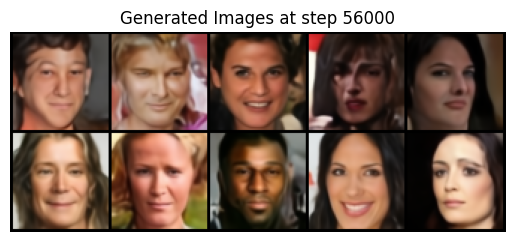

20:49:41 TRAINING Step [56100/87065]; Loss: 4.504574
20:49:59 TRAINING Step [56200/87065]; Loss: 4.501217
20:50:16 TRAINING Step [56300/87065]; Loss: 4.503818
20:50:34 TRAINING Step [56400/87065]; Loss: 4.503135
20:50:52 TRAINING Step [56500/87065]; Loss: 4.506574
20:51:09 TRAINING Step [56600/87065]; Loss: 4.500614
20:51:27 TRAINING Step [56700/87065]; Loss: 4.503971
20:51:45 TRAINING Step [56800/87065]; Loss: 4.505019
20:52:03 TRAINING Step [56900/87065]; Loss: 4.504695
20:52:21 TRAINING Step [57000/87065]; Loss: 4.507220
Checkpoint saved at step 57000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


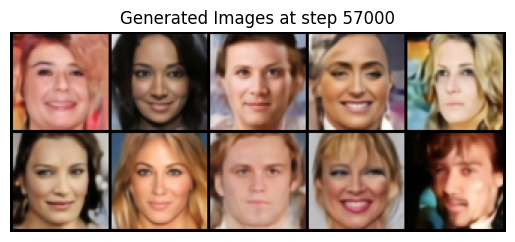

20:52:40 TRAINING Step [57100/87065]; Loss: 4.503734
20:52:57 TRAINING Step [57200/87065]; Loss: 4.499338
20:53:15 TRAINING Step [57300/87065]; Loss: 4.502103
20:53:33 TRAINING Step [57400/87065]; Loss: 4.499408
20:53:51 TRAINING Step [57500/87065]; Loss: 4.500144
20:54:08 TRAINING Step [57600/87065]; Loss: 4.501703
20:54:26 TRAINING Step [57700/87065]; Loss: 4.501786
20:54:44 TRAINING Step [57800/87065]; Loss: 4.500728
20:55:01 TRAINING Step [57900/87065]; Loss: 4.501630
20:55:19 TRAINING Step [58000/87065]; Loss: 4.503011
Checkpoint saved at step 58000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


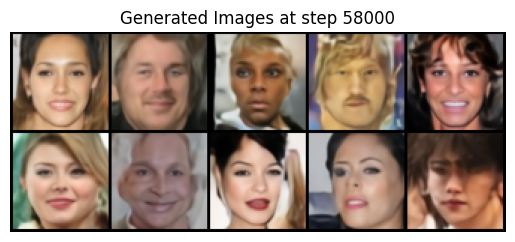

20:55:38 TRAINING Step [58100/87065]; Loss: 4.502859
20:55:56 TRAINING Step [58200/87065]; Loss: 4.506265
20:56:14 TRAINING Step [58300/87065]; Loss: 4.502228
20:56:31 TRAINING Step [58400/87065]; Loss: 4.504130
20:56:49 TRAINING Step [58500/87065]; Loss: 4.502202
20:57:07 TRAINING Step [58600/87065]; Loss: 4.499948
20:57:25 TRAINING Step [58700/87065]; Loss: 4.498811
20:57:42 TRAINING Step [58800/87065]; Loss: 4.500532
20:58:00 TRAINING Step [58900/87065]; Loss: 4.500014
20:58:18 TRAINING Step [59000/87065]; Loss: 4.499851
Checkpoint saved at step 59000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


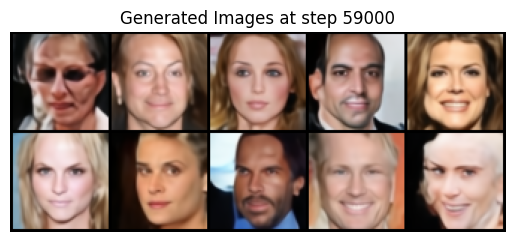

20:58:37 TRAINING Step [59100/87065]; Loss: 4.501860
20:58:55 TRAINING Step [59200/87065]; Loss: 4.499712
20:59:12 TRAINING Step [59300/87065]; Loss: 4.501946
20:59:30 TRAINING Step [59400/87065]; Loss: 4.501953
20:59:48 TRAINING Step [59500/87065]; Loss: 4.501775
21:00:05 TRAINING Step [59600/87065]; Loss: 4.495749
21:00:23 TRAINING Step [59700/87065]; Loss: 4.500568
21:00:41 TRAINING Step [59800/87065]; Loss: 4.495745
21:00:59 TRAINING Step [59900/87065]; Loss: 4.501722
21:01:16 TRAINING Step [60000/87065]; Loss: 4.502681
Checkpoint saved at step 60000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


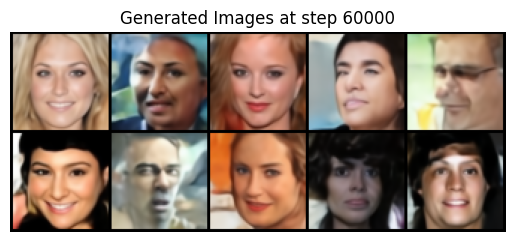

21:01:36 TRAINING Step [60100/87065]; Loss: 4.493799
21:01:53 TRAINING Step [60200/87065]; Loss: 4.499305
21:02:11 TRAINING Step [60300/87065]; Loss: 4.500764
21:02:29 TRAINING Step [60400/87065]; Loss: 4.497602
21:02:47 TRAINING Step [60500/87065]; Loss: 4.497040
21:03:04 TRAINING Step [60600/87065]; Loss: 4.500924
21:03:22 TRAINING Step [60700/87065]; Loss: 4.496616
21:03:40 TRAINING Step [60800/87065]; Loss: 4.496498
21:03:57 TRAINING Step [60900/87065]; Loss: 4.497456
21:04:15 TRAINING Step [61000/87065]; Loss: 4.500392
Checkpoint saved at step 61000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


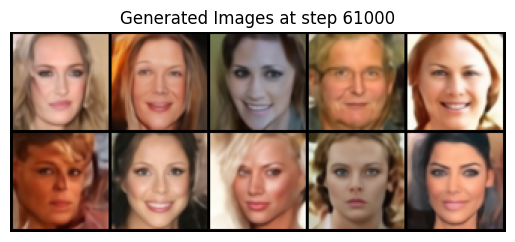

21:04:34 TRAINING Step [61100/87065]; Loss: 4.495246
21:04:52 TRAINING Step [61200/87065]; Loss: 4.496808
21:05:10 TRAINING Step [61300/87065]; Loss: 4.499169
21:05:27 TRAINING Step [61400/87065]; Loss: 4.498017
21:05:45 TRAINING Step [61500/87065]; Loss: 4.494457
21:06:03 TRAINING Step [61600/87065]; Loss: 4.495781
21:06:20 TRAINING Step [61700/87065]; Loss: 4.498002
21:06:38 TRAINING Step [61800/87065]; Loss: 4.494616
21:06:56 TRAINING Step [61900/87065]; Loss: 4.498439
21:07:14 TRAINING Step [62000/87065]; Loss: 4.493474
Checkpoint saved at step 62000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


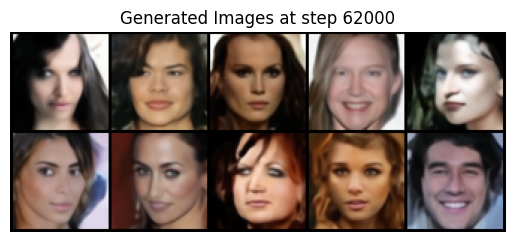

21:07:33 TRAINING Step [62100/87065]; Loss: 4.495387
21:07:51 TRAINING Step [62200/87065]; Loss: 4.496678
21:08:08 TRAINING Step [62300/87065]; Loss: 4.492622
21:08:26 TRAINING Step [62400/87065]; Loss: 4.491818
21:08:44 TRAINING Step [62500/87065]; Loss: 4.494488
21:09:01 TRAINING Step [62600/87065]; Loss: 4.494451
21:09:19 TRAINING Step [62700/87065]; Loss: 4.493005
21:09:37 TRAINING Step [62800/87065]; Loss: 4.496545
21:09:54 TRAINING Step [62900/87065]; Loss: 4.496064
21:10:12 TRAINING Step [63000/87065]; Loss: 4.498568
Checkpoint saved at step 63000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


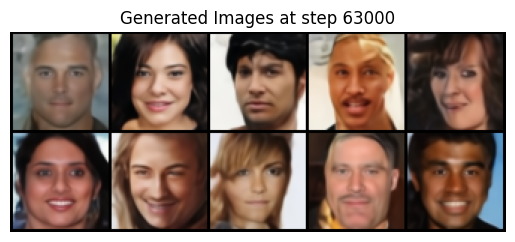

21:10:31 TRAINING Step [63100/87065]; Loss: 4.497878
21:10:49 TRAINING Step [63200/87065]; Loss: 4.498774
21:11:07 TRAINING Step [63300/87065]; Loss: 4.497295
21:11:25 TRAINING Step [63400/87065]; Loss: 4.491650
21:11:42 TRAINING Step [63500/87065]; Loss: 4.489536
21:12:00 TRAINING Step [63600/87065]; Loss: 4.493056
21:12:18 TRAINING Step [63700/87065]; Loss: 4.492020
21:12:36 TRAINING Step [63800/87065]; Loss: 4.492870
21:12:53 TRAINING Step [63900/87065]; Loss: 4.490101
21:13:11 TRAINING Step [64000/87065]; Loss: 4.493857
Checkpoint saved at step 64000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


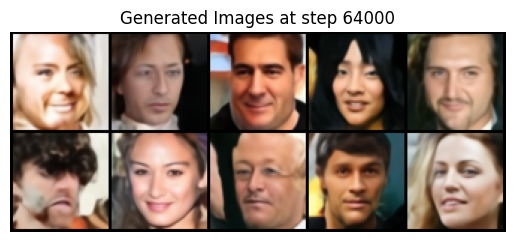

21:13:30 TRAINING Step [64100/87065]; Loss: 4.494723
21:13:48 TRAINING Step [64200/87065]; Loss: 4.490971
21:14:06 TRAINING Step [64300/87065]; Loss: 4.498837
21:14:23 TRAINING Step [64400/87065]; Loss: 4.492887
21:14:41 TRAINING Step [64500/87065]; Loss: 4.497346
21:14:59 TRAINING Step [64600/87065]; Loss: 4.497400
21:15:16 TRAINING Step [64700/87065]; Loss: 4.493371
21:15:34 TRAINING Step [64800/87065]; Loss: 4.493710
21:15:52 TRAINING Step [64900/87065]; Loss: 4.494431
21:16:10 TRAINING Step [65000/87065]; Loss: 4.490373
Checkpoint saved at step 65000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


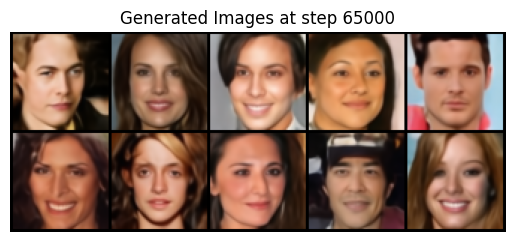

21:16:29 TRAINING Step [65100/87065]; Loss: 4.492499
21:16:47 TRAINING Step [65200/87065]; Loss: 4.487248
21:17:04 TRAINING Step [65300/87065]; Loss: 4.489952
21:17:22 TRAINING Step [65400/87065]; Loss: 4.492505
21:17:40 TRAINING Step [65500/87065]; Loss: 4.491645
21:17:57 TRAINING Step [65600/87065]; Loss: 4.490390
21:18:15 TRAINING Step [65700/87065]; Loss: 4.490818
21:18:33 TRAINING Step [65800/87065]; Loss: 4.494682
21:18:51 TRAINING Step [65900/87065]; Loss: 4.488559
21:19:08 TRAINING Step [66000/87065]; Loss: 4.490874
Checkpoint saved at step 66000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


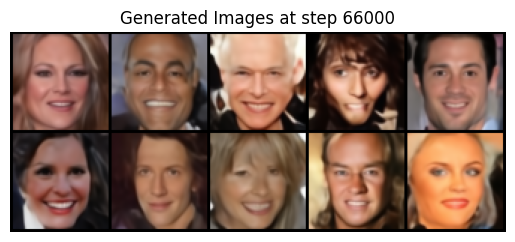

21:19:27 TRAINING Step [66100/87065]; Loss: 4.492052
21:19:45 TRAINING Step [66200/87065]; Loss: 4.492701
21:20:03 TRAINING Step [66300/87065]; Loss: 4.494202
21:20:21 TRAINING Step [66400/87065]; Loss: 4.495486
21:20:39 TRAINING Step [66500/87065]; Loss: 4.491315
21:20:56 TRAINING Step [66600/87065]; Loss: 4.489089
21:21:14 TRAINING Step [66700/87065]; Loss: 4.485559
21:21:32 TRAINING Step [66800/87065]; Loss: 4.491451
21:21:49 TRAINING Step [66900/87065]; Loss: 4.489886
21:22:07 TRAINING Step [67000/87065]; Loss: 4.494992
Checkpoint saved at step 67000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


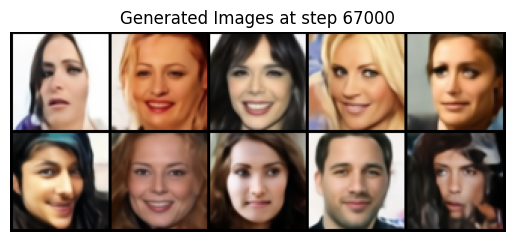

21:22:26 TRAINING Step [67100/87065]; Loss: 4.486713
21:22:44 TRAINING Step [67200/87065]; Loss: 4.484922
21:23:02 TRAINING Step [67300/87065]; Loss: 4.491268
21:23:19 TRAINING Step [67400/87065]; Loss: 4.492964
21:23:37 TRAINING Step [67500/87065]; Loss: 4.489038
21:23:55 TRAINING Step [67600/87065]; Loss: 4.489040
21:24:13 TRAINING Step [67700/87065]; Loss: 4.491276
21:24:30 TRAINING Step [67800/87065]; Loss: 4.487396
21:24:48 TRAINING Step [67900/87065]; Loss: 4.488064
21:25:06 TRAINING Step [68000/87065]; Loss: 4.493363
Checkpoint saved at step 68000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


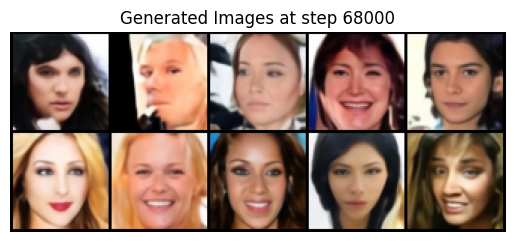

21:25:25 TRAINING Step [68100/87065]; Loss: 4.490135
21:25:43 TRAINING Step [68200/87065]; Loss: 4.487398
21:26:00 TRAINING Step [68300/87065]; Loss: 4.484100
21:26:18 TRAINING Step [68400/87065]; Loss: 4.487670
21:26:36 TRAINING Step [68500/87065]; Loss: 4.487626
21:26:54 TRAINING Step [68600/87065]; Loss: 4.486894
21:27:11 TRAINING Step [68700/87065]; Loss: 4.488862
21:27:29 TRAINING Step [68800/87065]; Loss: 4.486719
21:27:47 TRAINING Step [68900/87065]; Loss: 4.486602
21:28:04 TRAINING Step [69000/87065]; Loss: 4.489199
Checkpoint saved at step 69000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


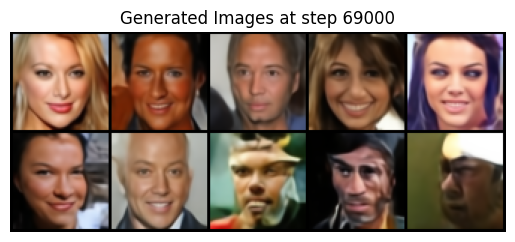

21:28:24 TRAINING Step [69100/87065]; Loss: 4.487050
21:28:41 TRAINING Step [69200/87065]; Loss: 4.487712
21:28:59 TRAINING Step [69300/87065]; Loss: 4.487882
21:29:17 TRAINING Step [69400/87065]; Loss: 4.489631
21:29:34 TRAINING Step [69500/87065]; Loss: 4.487484
21:29:52 TRAINING Step [69600/87065]; Loss: 4.492835
21:30:10 TRAINING Step [69700/87065]; Loss: 4.488378
21:30:28 TRAINING Step [69800/87065]; Loss: 4.481182
21:30:46 TRAINING Step [69900/87065]; Loss: 4.482145
21:31:03 TRAINING Step [70000/87065]; Loss: 4.489362
Checkpoint saved at step 70000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


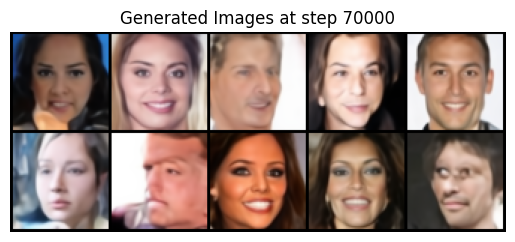

21:31:22 TRAINING Step [70100/87065]; Loss: 4.484122
21:31:40 TRAINING Step [70200/87065]; Loss: 4.487218
21:31:58 TRAINING Step [70300/87065]; Loss: 4.483102
21:32:16 TRAINING Step [70400/87065]; Loss: 4.486062
21:32:33 TRAINING Step [70500/87065]; Loss: 4.484261
21:32:51 TRAINING Step [70600/87065]; Loss: 4.487372
21:33:09 TRAINING Step [70700/87065]; Loss: 4.488222
21:33:26 TRAINING Step [70800/87065]; Loss: 4.488838
21:33:44 TRAINING Step [70900/87065]; Loss: 4.488485
21:34:02 TRAINING Step [71000/87065]; Loss: 4.489126
Checkpoint saved at step 71000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


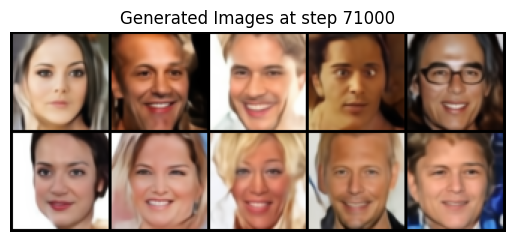

21:34:21 TRAINING Step [71100/87065]; Loss: 4.486303
21:34:39 TRAINING Step [71200/87065]; Loss: 4.484424
21:34:57 TRAINING Step [71300/87065]; Loss: 4.482954
21:35:14 TRAINING Step [71400/87065]; Loss: 4.482597
21:35:32 TRAINING Step [71500/87065]; Loss: 4.482194
21:35:50 TRAINING Step [71600/87065]; Loss: 4.489412
21:36:07 TRAINING Step [71700/87065]; Loss: 4.481701
21:36:25 TRAINING Step [71800/87065]; Loss: 4.484642
21:36:43 TRAINING Step [71900/87065]; Loss: 4.482625
21:37:01 TRAINING Step [72000/87065]; Loss: 4.484705
Checkpoint saved at step 72000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


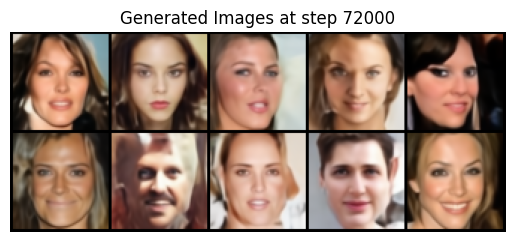

21:37:20 TRAINING Step [72100/87065]; Loss: 4.484596
21:37:37 TRAINING Step [72200/87065]; Loss: 4.484670
21:37:55 TRAINING Step [72300/87065]; Loss: 4.487975
21:38:13 TRAINING Step [72400/87065]; Loss: 4.487008
21:38:31 TRAINING Step [72500/87065]; Loss: 4.484424
21:38:48 TRAINING Step [72600/87065]; Loss: 4.481786
21:39:06 TRAINING Step [72700/87065]; Loss: 4.486263
21:39:24 TRAINING Step [72800/87065]; Loss: 4.484071
21:39:42 TRAINING Step [72900/87065]; Loss: 4.480410
21:39:59 TRAINING Step [73000/87065]; Loss: 4.485505
Checkpoint saved at step 73000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


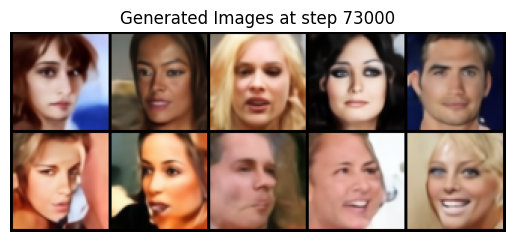

21:40:18 TRAINING Step [73100/87065]; Loss: 4.478874
21:40:36 TRAINING Step [73200/87065]; Loss: 4.484854
21:40:54 TRAINING Step [73300/87065]; Loss: 4.483591
21:41:12 TRAINING Step [73400/87065]; Loss: 4.481810
21:41:29 TRAINING Step [73500/87065]; Loss: 4.480190
21:41:47 TRAINING Step [73600/87065]; Loss: 4.483296
21:42:05 TRAINING Step [73700/87065]; Loss: 4.481342
21:42:22 TRAINING Step [73800/87065]; Loss: 4.482674
21:42:40 TRAINING Step [73900/87065]; Loss: 4.482297
21:42:58 TRAINING Step [74000/87065]; Loss: 4.482623
Checkpoint saved at step 74000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


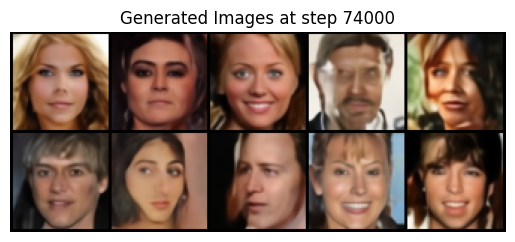

21:43:17 TRAINING Step [74100/87065]; Loss: 4.479689
21:43:35 TRAINING Step [74200/87065]; Loss: 4.488284
21:43:52 TRAINING Step [74300/87065]; Loss: 4.483669
21:44:10 TRAINING Step [74400/87065]; Loss: 4.484845
21:44:28 TRAINING Step [74500/87065]; Loss: 4.485043
21:44:46 TRAINING Step [74600/87065]; Loss: 4.476354
21:45:03 TRAINING Step [74700/87065]; Loss: 4.480409
21:45:21 TRAINING Step [74800/87065]; Loss: 4.477853
21:45:39 TRAINING Step [74900/87065]; Loss: 4.483733
21:45:57 TRAINING Step [75000/87065]; Loss: 4.478444
Checkpoint saved at step 75000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


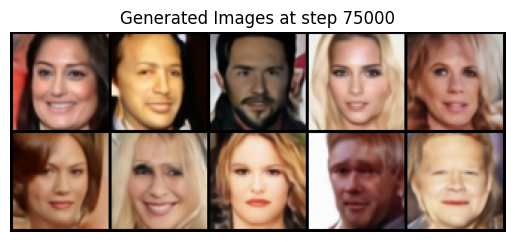

21:46:16 TRAINING Step [75100/87065]; Loss: 4.485347
21:46:33 TRAINING Step [75200/87065]; Loss: 4.477590
21:46:51 TRAINING Step [75300/87065]; Loss: 4.483834
21:47:09 TRAINING Step [75400/87065]; Loss: 4.482553
21:47:27 TRAINING Step [75500/87065]; Loss: 4.482277
21:47:44 TRAINING Step [75600/87065]; Loss: 4.480927
21:48:02 TRAINING Step [75700/87065]; Loss: 4.482183
21:48:20 TRAINING Step [75800/87065]; Loss: 4.480161
21:48:37 TRAINING Step [75900/87065]; Loss: 4.479398
21:48:55 TRAINING Step [76000/87065]; Loss: 4.480443
Checkpoint saved at step 76000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


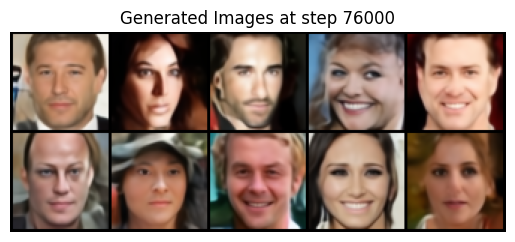

21:49:15 TRAINING Step [76100/87065]; Loss: 4.479454
21:49:32 TRAINING Step [76200/87065]; Loss: 4.477912
21:49:50 TRAINING Step [76300/87065]; Loss: 4.477946
21:50:08 TRAINING Step [76400/87065]; Loss: 4.478835
21:50:25 TRAINING Step [76500/87065]; Loss: 4.476044
21:50:43 TRAINING Step [76600/87065]; Loss: 4.477405
21:51:01 TRAINING Step [76700/87065]; Loss: 4.480360
21:51:19 TRAINING Step [76800/87065]; Loss: 4.479153
21:51:36 TRAINING Step [76900/87065]; Loss: 4.480235
21:51:54 TRAINING Step [77000/87065]; Loss: 4.482829
Checkpoint saved at step 77000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


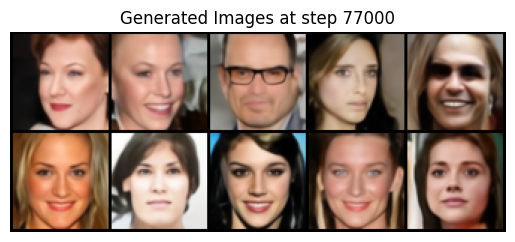

21:52:13 TRAINING Step [77100/87065]; Loss: 4.483390
21:52:31 TRAINING Step [77200/87065]; Loss: 4.480618
21:52:49 TRAINING Step [77300/87065]; Loss: 4.479686
21:53:06 TRAINING Step [77400/87065]; Loss: 4.481671
21:53:24 TRAINING Step [77500/87065]; Loss: 4.479882
21:53:42 TRAINING Step [77600/87065]; Loss: 4.480139
21:54:00 TRAINING Step [77700/87065]; Loss: 4.479553
21:54:17 TRAINING Step [77800/87065]; Loss: 4.475949
21:54:35 TRAINING Step [77900/87065]; Loss: 4.476842
21:54:53 TRAINING Step [78000/87065]; Loss: 4.475065
Checkpoint saved at step 78000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


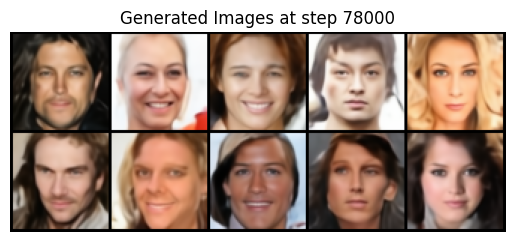

21:55:12 TRAINING Step [78100/87065]; Loss: 4.480939
21:55:30 TRAINING Step [78200/87065]; Loss: 4.476260
21:55:47 TRAINING Step [78300/87065]; Loss: 4.478355
21:56:05 TRAINING Step [78400/87065]; Loss: 4.482565
21:56:23 TRAINING Step [78500/87065]; Loss: 4.477240
21:56:40 TRAINING Step [78600/87065]; Loss: 4.476019
21:56:58 TRAINING Step [78700/87065]; Loss: 4.481103
21:57:16 TRAINING Step [78800/87065]; Loss: 4.475087
21:57:34 TRAINING Step [78900/87065]; Loss: 4.478606
21:57:51 TRAINING Step [79000/87065]; Loss: 4.479111
Checkpoint saved at step 79000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


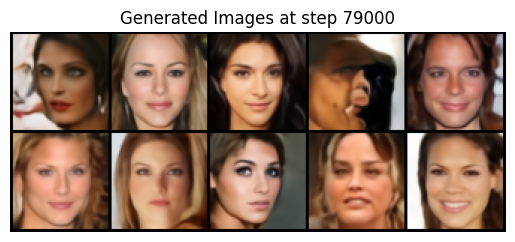

21:58:10 TRAINING Step [79100/87065]; Loss: 4.477378
21:58:28 TRAINING Step [79200/87065]; Loss: 4.476338
21:58:46 TRAINING Step [79300/87065]; Loss: 4.474830
21:59:04 TRAINING Step [79400/87065]; Loss: 4.480383
21:59:21 TRAINING Step [79500/87065]; Loss: 4.473753
21:59:39 TRAINING Step [79600/87065]; Loss: 4.474362
21:59:57 TRAINING Step [79700/87065]; Loss: 4.474428
22:00:15 TRAINING Step [79800/87065]; Loss: 4.477289
22:00:32 TRAINING Step [79900/87065]; Loss: 4.476533
22:00:50 TRAINING Step [80000/87065]; Loss: 4.478531
Checkpoint saved at step 80000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


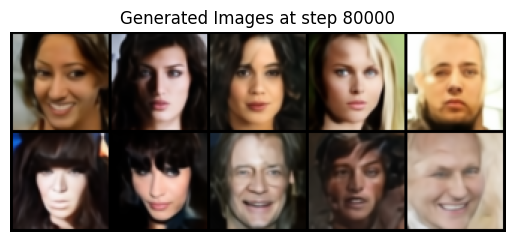

22:01:09 TRAINING Step [80100/87065]; Loss: 4.475756
22:01:27 TRAINING Step [80200/87065]; Loss: 4.477893
22:01:45 TRAINING Step [80300/87065]; Loss: 4.475110
22:02:02 TRAINING Step [80400/87065]; Loss: 4.476841
22:02:20 TRAINING Step [80500/87065]; Loss: 4.478697
22:02:38 TRAINING Step [80600/87065]; Loss: 4.478562
22:02:55 TRAINING Step [80700/87065]; Loss: 4.477607
22:03:13 TRAINING Step [80800/87065]; Loss: 4.472031
22:03:31 TRAINING Step [80900/87065]; Loss: 4.476593
22:03:49 TRAINING Step [81000/87065]; Loss: 4.473226
Checkpoint saved at step 81000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


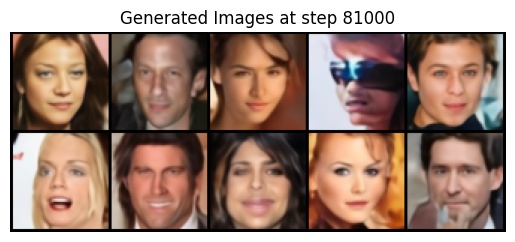

22:04:08 TRAINING Step [81100/87065]; Loss: 4.473052
22:04:26 TRAINING Step [81200/87065]; Loss: 4.473740
22:04:43 TRAINING Step [81300/87065]; Loss: 4.472231
22:05:01 TRAINING Step [81400/87065]; Loss: 4.475671
22:05:19 TRAINING Step [81500/87065]; Loss: 4.475432
22:05:37 TRAINING Step [81600/87065]; Loss: 4.477261
22:05:54 TRAINING Step [81700/87065]; Loss: 4.479624
22:06:12 TRAINING Step [81800/87065]; Loss: 4.477197
22:06:30 TRAINING Step [81900/87065]; Loss: 4.475336
22:06:47 TRAINING Step [82000/87065]; Loss: 4.475692
Checkpoint saved at step 82000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


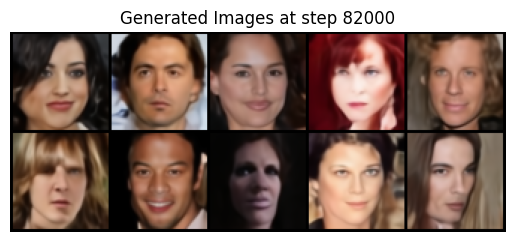

22:07:07 TRAINING Step [82100/87065]; Loss: 4.476145
22:07:24 TRAINING Step [82200/87065]; Loss: 4.475891
22:07:42 TRAINING Step [82300/87065]; Loss: 4.476854
22:08:00 TRAINING Step [82400/87065]; Loss: 4.472635
22:08:18 TRAINING Step [82500/87065]; Loss: 4.470572
22:08:35 TRAINING Step [82600/87065]; Loss: 4.473156
22:08:53 TRAINING Step [82700/87065]; Loss: 4.475230
22:09:11 TRAINING Step [82800/87065]; Loss: 4.473002
22:09:28 TRAINING Step [82900/87065]; Loss: 4.477921
22:09:46 TRAINING Step [83000/87065]; Loss: 4.473964
Checkpoint saved at step 83000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


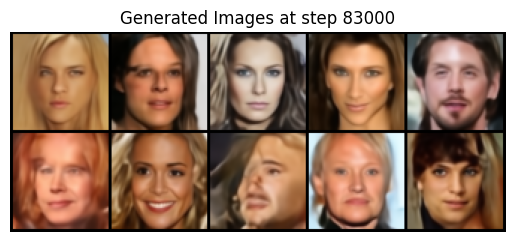

22:10:05 TRAINING Step [83100/87065]; Loss: 4.470295
22:10:23 TRAINING Step [83200/87065]; Loss: 4.476176
22:10:41 TRAINING Step [83300/87065]; Loss: 4.472991
22:10:58 TRAINING Step [83400/87065]; Loss: 4.475829
22:11:16 TRAINING Step [83500/87065]; Loss: 4.475464
22:11:34 TRAINING Step [83600/87065]; Loss: 4.470764
22:11:51 TRAINING Step [83700/87065]; Loss: 4.476014
22:12:09 TRAINING Step [83800/87065]; Loss: 4.472548
22:12:27 TRAINING Step [83900/87065]; Loss: 4.473350
22:12:45 TRAINING Step [84000/87065]; Loss: 4.471988
Checkpoint saved at step 84000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


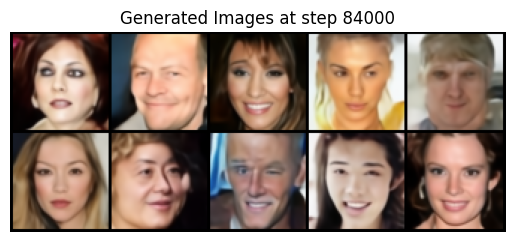

22:13:04 TRAINING Step [84100/87065]; Loss: 4.472544
22:13:22 TRAINING Step [84200/87065]; Loss: 4.472054
22:13:40 TRAINING Step [84300/87065]; Loss: 4.471504
22:13:57 TRAINING Step [84400/87065]; Loss: 4.471301
22:14:15 TRAINING Step [84500/87065]; Loss: 4.472534
22:14:33 TRAINING Step [84600/87065]; Loss: 4.469176
22:14:50 TRAINING Step [84700/87065]; Loss: 4.472561
22:15:08 TRAINING Step [84800/87065]; Loss: 4.472277
22:15:26 TRAINING Step [84900/87065]; Loss: 4.472958
22:15:43 TRAINING Step [85000/87065]; Loss: 4.473867
Checkpoint saved at step 85000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


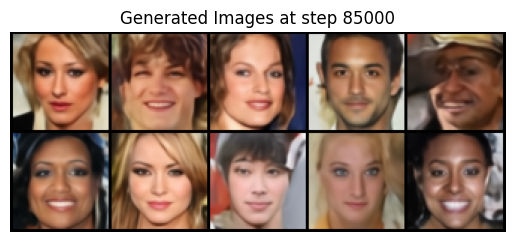

22:16:03 TRAINING Step [85100/87065]; Loss: 4.473051
22:16:20 TRAINING Step [85200/87065]; Loss: 4.472470
22:16:38 TRAINING Step [85300/87065]; Loss: 4.473999
22:16:56 TRAINING Step [85400/87065]; Loss: 4.472540
22:17:14 TRAINING Step [85500/87065]; Loss: 4.472751
22:17:31 TRAINING Step [85600/87065]; Loss: 4.468363
22:17:49 TRAINING Step [85700/87065]; Loss: 4.470320
22:18:07 TRAINING Step [85800/87065]; Loss: 4.472682
22:18:24 TRAINING Step [85900/87065]; Loss: 4.468638
22:18:42 TRAINING Step [86000/87065]; Loss: 4.473078
Checkpoint saved at step 86000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


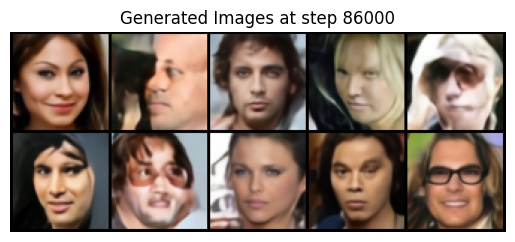

22:19:01 TRAINING Step [86100/87065]; Loss: 4.468771
22:19:19 TRAINING Step [86200/87065]; Loss: 4.473383
22:19:37 TRAINING Step [86300/87065]; Loss: 4.470826
22:19:55 TRAINING Step [86400/87065]; Loss: 4.467122
22:20:12 TRAINING Step [86500/87065]; Loss: 4.473543
22:20:30 TRAINING Step [86600/87065]; Loss: 4.474001
22:20:48 TRAINING Step [86700/87065]; Loss: 4.470813
22:21:05 TRAINING Step [86800/87065]; Loss: 4.471825
22:21:23 TRAINING Step [86900/87065]; Loss: 4.473258
22:21:41 TRAINING Step [87000/87065]; Loss: 4.470267
Checkpoint saved at step 87000 to /content/drive/MyDrive/transformer_models/checkpoint.pt


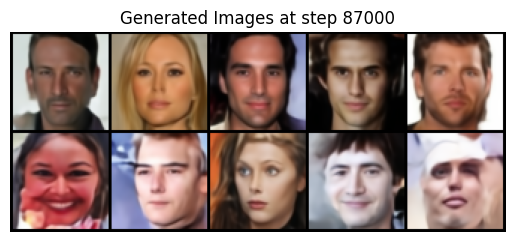

Checkpoint saved at step 87065 to /content/drive/MyDrive/transformer_models/checkpoint.pt


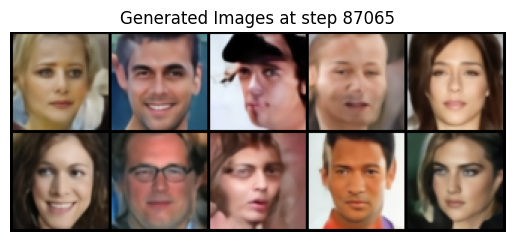

Training complete.


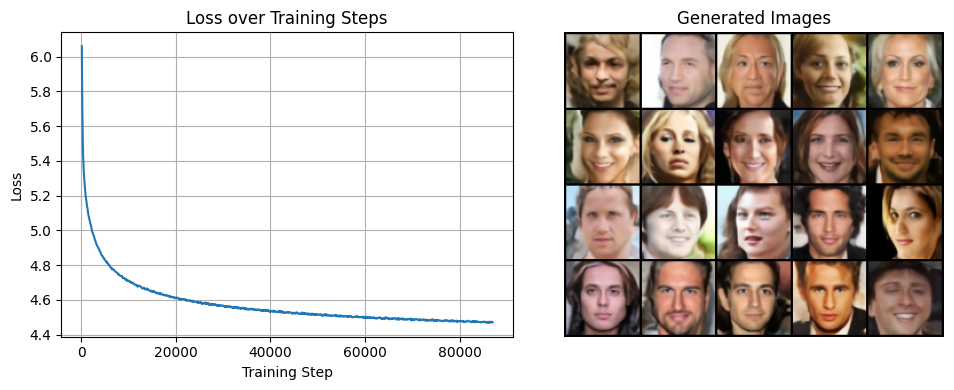

In [ ]:
from time import strftime

# Initialize and train a model. If you just want to load one from a checkpoint and not train, set EPOCHS = 0
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# training hyperparemeters
EPOCHS = 55
BATCH_SIZE = 256

# logging/saving hyperparemters
LOG_INTERVAL = 100
SAVE_INTERVAL = 1000
CHECKPOINT_DIR = '/content/drive/MyDrive/transformer_models'
CHECKPOINT_PATH = os.path.join(CHECKPOINT_DIR, 'checkpoint.pt')
LOAD_FROM_CHECKPOINT = False #True

dataloader = torch.utils.data.DataLoader(celeba_embeddings, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
model = TransformerPrior(H=LATENT_H, W=LATENT_W).to(device)
total_steps = len(dataloader) * EPOCHS

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=2e-4,           # peak LR
    betas=(0.9, 0.95)  
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=total_steps,
    eta_min=1e-5
)

training_losses = []
training_steps = 0
running_loss = 0.0

# load from checkpoint
if LOAD_FROM_CHECKPOINT:
    if not os.path.exists(CHECKPOINT_PATH):
        print(f'WARNING: Checkpoint not found at {CHECKPOINT_PATH}!')
    else:
        checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)

        model.load_state_dict(checkpoint['model_state'])
        optimizer.load_state_dict(checkpoint['optimizer_state'])
        training_steps = checkpoint['training_steps']
        training_losses = checkpoint['training_losses']
        running_loss = checkpoint['running_loss']

        print(f'Checkpoint loaded. Resuming from training step {training_steps}.')

total_steps = training_steps + len(dataloader) * EPOCHS

# training loop
print(f'{strftime('%H:%M:%S')} Begin Training')
model.train()
for epoch in range(EPOCHS):
    for batch_idx, batch in enumerate(dataloader):
        # training step
        targets, = batch
        targets = targets.to(device).long()
        inputs = torch.empty_like(targets)
        inputs[:, 0] = BOS_ID
        inputs[:, 1:] = targets[:, :-1]
        if torch.any(targets < 0) or torch.any(targets >= VOCAB_SIZE):
          print("Invalid targets detected:",
                targets.min().item(),
                targets.max().item())
          raise RuntimeError("Invalid target token")

        if torch.any(inputs < 0) or torch.any(inputs >= VOCAB_SIZE):
            print("Invalid inputs detected:",
                  inputs.min().item(),
                  inputs.max().item())
            raise RuntimeError("Invalid input token")


        logits = model(inputs)
        loss = nn.functional.cross_entropy(
            logits.view(-1, VOCAB_SIZE),
            targets.view(-1)
        )

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        training_steps += 1

        running_loss += loss.item()

        # logging step
        if training_steps % LOG_INTERVAL == 0:
            avg_loss = running_loss / LOG_INTERVAL
            running_loss = 0.0
            training_losses.append((training_steps, avg_loss))
            print(f'{strftime('%H:%M:%S')} TRAINING Step [{training_steps}/{total_steps}]; Loss: {avg_loss:.6f}, LR: {scheduler.get_last_lr}')

        # saving step
        if training_steps % SAVE_INTERVAL == 0 or (epoch == EPOCHS - 1 and batch_idx == len(dataloader) - 1):
            checkpoint = {
                'training_steps': training_steps,
                'model_state': model.state_dict(),
                'optimizer_state': optimizer.state_dict(),
                'training_losses': training_losses,
                'running_loss': running_loss,
            }

            torch.save(checkpoint, CHECKPOINT_PATH)
            print(f'Checkpoint saved at step {training_steps} to {CHECKPOINT_PATH}')

            # visualize reconstructions
            grid_x = 5
            grid_y = 2

            model.eval()
            samples = model.generate(grid_x * grid_y)
            model.train()

            images = vq_vae.reconstruct_from_indices(samples.view(-1, LATENT_W, LATENT_H))
            img = torchvision.utils.make_grid(images, grid_x, normalize=True, value_range=(0, 1))

            plt.title(f'Generated Images at step {training_steps}')
            plt.axis('off')
            plt.imshow(img.permute(1,2,0).cpu())
            plt.show()

print(f'Training complete.')

# Prepare reconstructions
grid_x = 5
grid_y = 4

model.eval()
samples = model.generate(grid_x * grid_y)

images = vq_vae.reconstruct_from_indices(samples.view(-1, LATENT_W, LATENT_H))
img = torchvision.utils.make_grid(images, grid_x, normalize=True, value_range=(0, 1))

# Side-by-side plot
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Loss curves
axes[0].plot(*zip(*training_losses))

axes[0].set_xlabel('Training Step')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss over Training Steps')
axes[0].grid(True)

# Reconstructions
axes[1].imshow(img.permute(1, 2, 0).cpu())
axes[1].set_title('Generated Images')
axes[1].axis('off')

plt.tight_layout()
plt.show()